<a href="https://colab.research.google.com/github/kansoy/-Econometric-textbook-stata-replication/blob/master/graphs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn

import re
from tqdm.auto import tqdm
import torch
from torch.nn import Softmax
import nltk
from nltk.tokenize import sent_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification as AMFSC

In [ ]:
minute_frame = pd.read_csv("C:/Users/huohh/Desktop/output.csv")
speech_frame = pd.read_csv("C:/Users/huohh/Desktop/speech_output.csv")
minute_text = pd.read_csv("C:/Users/huohh/Desktop/Central bank communication/text.csv")
speech_text = pd.read_csv("C:/Users/huohh/Desktop/Central bank communication/speech_text.csv")

FileNotFoundError: [Errno 2] No such file or directory: 'C:/Users/huohh/Desktop/output.csv'

In [ ]:
minute_frame.describe()

,Minute wordnum,Statement wordnum,Transcript wordnum,Minute sentnum,Statement sentnum,Transcript sentnum,Minute mean score,Statement mean score,Transcript mean score,Statementpositive sentences,...,Transcript Hawishness,Statement positive sentences,Statement negative sentences,Statement neutral sentences,Minute positive sentences,Minute negative sentences,Minute neutral sentences,Transcript positive sentences,Transcript negative sentences,Transcript neutral sentences
count,233.000000,237.000000,193.000000,233.000000,237.000000,193.000000,233.000000,237.000000,193.000000,209.000000,...,193.000000,237.000000,237.000000,237.000000,233.000000,233.000000,233.000000,193.000000,193.000000,193.000000
mean,8800.669528,1301.835443,69100.575130,234.566524,47.864979,2694.450777,0.003220,0.108554,-0.011467,5.339713,...,0.006031,20.371308,18.084388,9.409283,83.347639,84.931330,66.287554,403.958549,496.621762,1793.870466
std,2961.393582,3162.486093,26560.036842,77.476282,133.114734,1004.808232,0.113675,0.190875,0.043341,2.963626,...,0.221785,60.570918,57.622835,18.873273,22.888489,29.642184,46.015633,123.880312,151.377174,798.763529
min,4227.000000,115.000000,20385.000000,115.000000,4.000000,881.000000,-0.320593,-0.330747,-0.164957,1.000000,...,-0.586207,1.000000,0.000000,1.000000,29.000000,30.000000,17.000000,46.000000,118.000000,509.000000
25%,5962.000000,354.000000,46629.000000,161.000000,10.000000,1870.000000,-0.062581,-0.033137,-0.036084,3.000000,...,-0.135135,3.000000,1.000000,4.000000,67.000000,59.000000,33.000000,308.000000,367.000000,1161.000000
50%,9024.000000,550.000000,65886.000000,239.000000,16.000000,2516.000000,0.005079,0.106373,-0.010549,5.000000,...,0.000000,5.000000,4.000000,6.000000,80.000000,85.000000,57.000000,400.000000,506.000000,1596.000000
75%,10586.000000,752.000000,89264.000000,278.000000,21.000000,3447.000000,0.078415,0.234959,0.019987,8.000000,...,0.130435,9.000000,6.000000,9.000000,97.000000,105.000000,78.000000,494.000000,598.000000,2376.000000
max,18179.000000,17367.000000,142637.000000,475.000000,833.000000,5672.000000,0.324764,0.538232,0.083732,12.000000,...,0.666667,349.000000,305.000000,221.000000,150.000000,168.000000,252.000000,797.000000,846.000000,4227.000000


In [ ]:
speech_frame.describe()

,Speech wordnum,Speech sentnum,mean score,Speech positive sentences,Speech negative sentences,Speech neutral sentences,FK score,Hawishness
count,1712.000000,1712.000000,1712.000000,1712.000000,1712.000000,1712.000000,1711.000000,928.000000
mean,4298.568341,133.428154,0.049390,23.385514,22.626752,87.415888,14.900745,-0.046942
std,2139.794593,70.632407,0.120136,13.248415,17.533011,59.169747,2.073868,0.551111
min,59.000000,1.000000,-0.471196,0.000000,0.000000,1.000000,6.884125,-1.000000
25%,2913.250000,90.000000,-0.029993,14.000000,9.000000,48.000000,13.835215,-0.333333
50%,4139.000000,126.000000,0.042340,22.000000,19.000000,76.000000,14.947035,-0.044127
75%,5333.500000,164.000000,0.120238,31.000000,32.000000,108.000000,16.014877,0.200000
max,18990.000000,642.000000,0.518603,95.000000,127.000000,521.000000,57.217864,1.000000


In [ ]:
minute_text.describe()

,Heading,Minute date,Minute text,Statement text,Transcript text
count,248,236,233,237,193
unique,248,236,233,237,193
top,January 31-February 1 Meeting - 1995,1995-03-31,Minutes of the Federal Open Market Committee M...,"Release Date: February 1, 1995 For immediate r...",Meeting of the Federal Open Market Committee J...
freq,1,1,1,1,1


In [ ]:
speech_text.describe()

,Title,Governor,Date,Speech link,Speech
count,1719,1719,1719,1719,1719
unique,1500,52,1451,1712,1714
top,Welcoming Remarks,Chairman Alan Greenspan,2002-11-12,https://www.federalreserve.gov/boarddocs/speec...,Remarks by Governor Edward M. Gramlich At the ...
freq,32,185,5,3,3


In [ ]:
minute_frame["Minute date"] = pd.to_datetime(minute_frame["Minute date"])
minute_frame.head()

,Heading,Minute date,Minute wordnum,Statement wordnum,Transcript wordnum,Minute sentnum,Statement sentnum,Transcript sentnum,Minute mean score,Statement mean score,...,Transcript Hawishness,Statement positive sentences,Statement negative sentences,Statement neutral sentences,Minute positive sentences,Minute negative sentences,Minute neutral sentences,Transcript positive sentences,Transcript negative sentences,Transcript neutral sentences
0,January 31-February 1 Meeting - 1995,1995-03-31,10545.0,207.0,102453.0,263.0,7.0,4907.0,0.080507,0.388746,...,-0.020408,3.0,0.0,4.0,98.0,74.0,91.0,306.0,492.0,4109.0
1,March 28 Meeting - 1995,1995-05-26,9847.0,16514.0,38179.0,266.0,833.0,1691.0,-0.021055,0.002269,...,0.666667,308.0,304.0,221.0,64.0,78.0,124.0,199.0,252.0,1240.0
2,May 23 Meeting - 1995,1995-07-07,6371.0,15522.0,27297.0,169.0,620.0,1179.0,0.057078,-0.060545,...,0.666667,269.0,305.0,46.0,77.0,59.0,33.0,155.0,256.0,768.0
3,July 5-6 Meeting - 1995,1995-08-25,8905.0,115.0,53008.0,236.0,4.0,2237.0,0.090347,-0.030123,...,0.000000,1.0,1.0,2.0,101.0,75.0,60.0,263.0,406.0,1568.0
4,August 22 Meeting - 1995,1995-09-29,5637.0,16059.0,28009.0,158.0,670.0,1267.0,0.207942,0.004474,...,0.400000,321.0,303.0,46.0,81.0,45.0,32.0,213.0,224.0,830.0


In [ ]:
speech_frame["Date"] = pd.to_datetime(speech_frame["Date"])
speech_frame.head()

,Title,Governor,Date,Speech wordnum,Speech sentnum,mean score,Speech positive sentences,Speech negative sentences,Speech neutral sentences,FK score,Hawishness,Type
0,Bank supervision in a world economy,Chairman Alan Greenspan,1996-06-13,4081,132,0.053503,15,16,101,15.117360,NaN,chair
1,Developments in electronic money and banking,"Governor Edward W. Kelley, Jr.",1996-06-18,3310,87,0.076873,13,9,65,17.674333,NaN,governor
2,Monetary policy objectives and strategy,Governor Laurence H. Meyer,1996-09-08,3688,118,-0.041891,14,28,76,13.855610,0.157895,governor
3,Regulation and electronic payment systems,Chairman Alan Greenspan,1996-09-19,2589,87,-0.019191,6,12,69,14.083780,NaN,chair
4,Small business is big business,Governor Lawrence B. Lindsey,1996-10-02,2796,97,0.125150,23,12,62,12.344356,1.000000,governor


In [ ]:
plt.style.use("seaborn-whitegrid")

Scatter plot of sentiment score for three types of FOMC texts (statement, minute, and transcript) over time.The horizontal lines represent the mean for specific types of text.

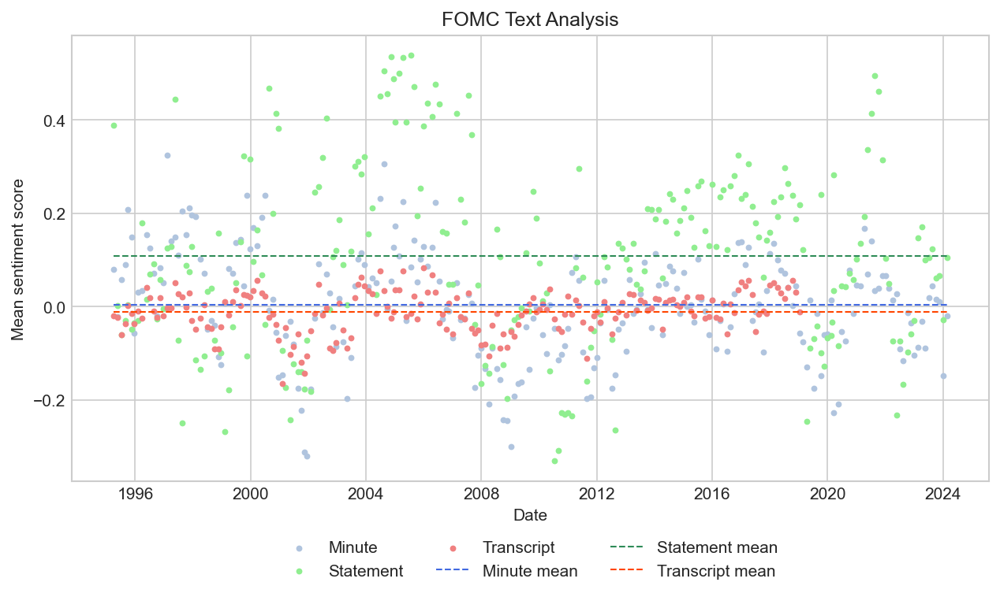

In [ ]:
fig = plt.figure(figsize=(10, 5), dpi=150)
ax = plt.axes()

date = minute_frame["Minute date"]
minute_score = minute_frame["Minute mean score"]
statement_score = minute_frame["Statement mean score"]
transcript_score = minute_frame["Transcript mean score"]

minute_mean = [minute_score.mean()] * len(date)
statement_mean = [statement_score.mean()] * len(date)
transcript_mean = [transcript_score.mean()] * len(date)

plt.scatter(date, minute_score, marker=".", s=30, label="Minute", color="lightsteelblue")
plt.scatter(date, statement_score, marker=".", s=30, label="Statement", color="lightgreen")
plt.scatter(date, transcript_score, marker=".", s=30, label="Transcript", color="lightcoral")

plt.plot(date, minute_mean, linestyle="--", markersize=6, linewidth=1, label="Minute mean", color="royalblue")
plt.plot(date, statement_mean, linestyle="--", markersize=6, linewidth=1, label="Statement mean", color="seagreen")
plt.plot(date, transcript_mean, linestyle="--", markersize=6, linewidth=1, label="Transcript mean", color="orangered")

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=3)
plt.ylabel("Mean sentiment score")
plt.xlabel("Date")
plt.title("FOMC Text Analysis")

plt.show()


In [ ]:
 #data source: NBER based Recession Indicators (https://fred.stlouisfed.org/series/USREC)
recession_period = [["2001/04/01","2001/11/01"],["2008/01/01","2009/06/01"],["2020/03/01","2020/04/01"]]

i = 0
for period in recession_period:
    recession_period[i] = [pd.to_datetime(period[0]), pd.to_datetime(period[1])]
    i += 1

Scatter plot of sentiment score for three types of FOMC texts (statement, minute, and transcript) over time, with rolling averages (window size = 8).

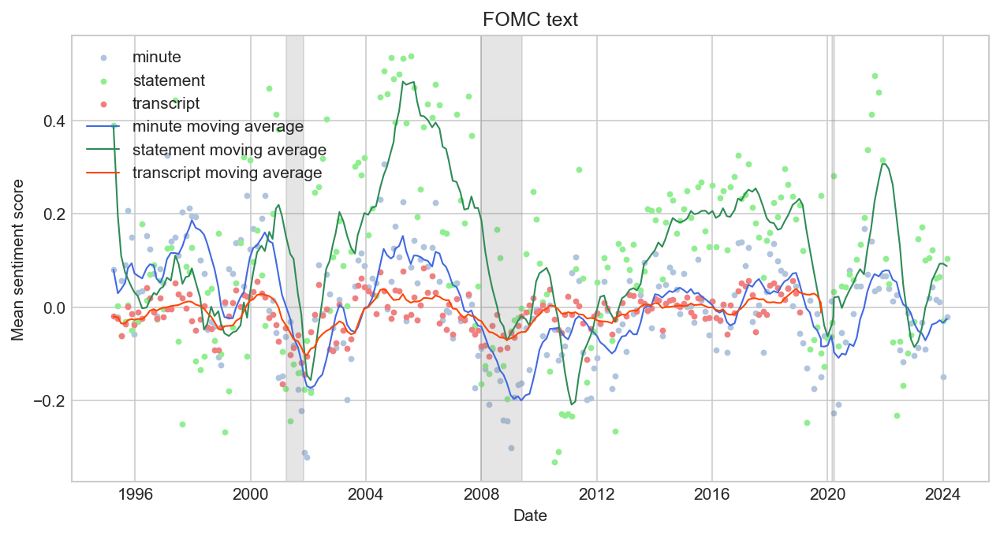

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

date = minute_frame["Minute date"]
minute_score = minute_frame["Minute mean score"]
statement_score = minute_frame["Statement mean score"]
transcript_score = minute_frame["Transcript mean score"]

minute_rolling_mean = minute_score.rolling(window = 8, min_periods = 1).mean()
statement_rolling_mean = statement_score.rolling(window = 8, min_periods = 1).mean()
transcript_rolling_mean = transcript_score.rolling(window = 8, min_periods = 1).mean()

plt.scatter(date, minute_score, marker = ".", s = 30, label = "minute", color = "lightsteelblue")
plt.scatter(date, statement_score, marker = ".", s = 30, label = "statement", color = "lightgreen")
plt.scatter(date, transcript_score, marker = ".", s = 30, label = "transcript", color = "lightcoral")

plt.plot(date, minute_rolling_mean, linestyle = "-", markersize = 6, linewidth = 1, label = "minute moving average", color = "royalblue")
plt.plot(date, statement_rolling_mean, linestyle = "-", markersize = 6, linewidth = 1, label = "statement moving average", color = "seagreen")
plt.plot(date, transcript_rolling_mean, linestyle = "-", markersize = 6, linewidth = 1, label = "transcript moving average", color = "orangered")

plt.legend()
plt.ylabel("Mean sentiment score")
plt.xlabel("Date")
plt.title("FOMC text")

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

Scatter plot of sentiment score for governor speeches over time, with rolling averages (window size = 30).

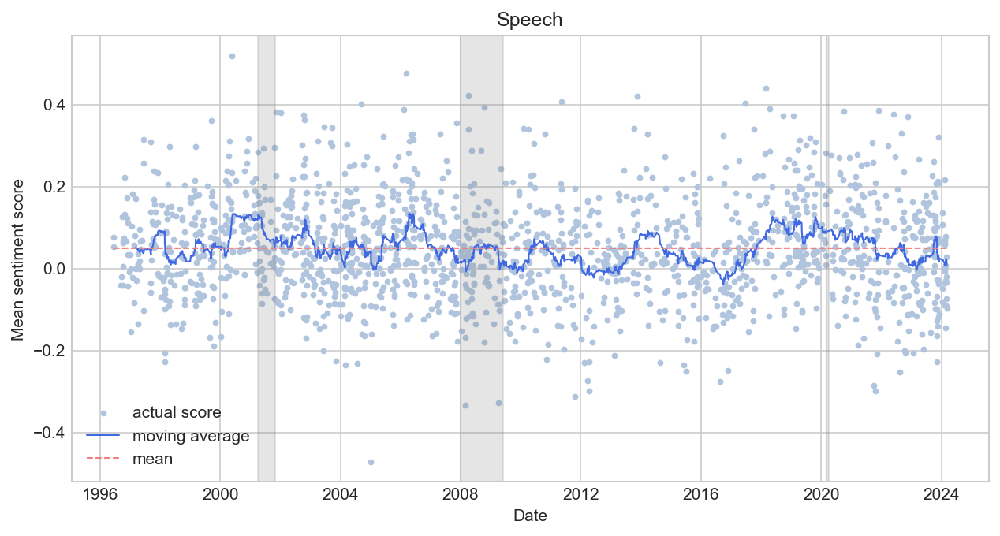

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

date = speech_frame["Date"]
speech_score = speech_frame["mean score"]
rolling_mean = speech_score.rolling(window = 30).mean()
mean = [speech_score.mean()]*len(date)

plt.scatter(date, speech_score, marker = ".", s = 30, c = "lightsteelblue", label = "actual score")
plt.plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average", color = "royalblue")
plt.plot(date, mean, linestyle = "--", linewidth = 1, label = "mean", color = "lightcoral")

plt.legend()
plt.ylabel("Mean sentiment score")
plt.xlabel("Date")
plt.title("Speech")

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

In [ ]:
def classify(speecher):
    if "Governor" in speecher:
        s_type = "governor"
    else:
        if "Chair" in speecher:
            if "Vice" in speecher:
                s_type = "vice chair"
            else:
                s_type = "chair"
        else:
            s_type = np.nan
    return s_type

speech_frame["Type"] = speech_frame["Governor"].apply(classify)
speech_frame["Type"].describe()

count         1711
unique           3
top       governor
freq           901
Name: Type, dtype: object

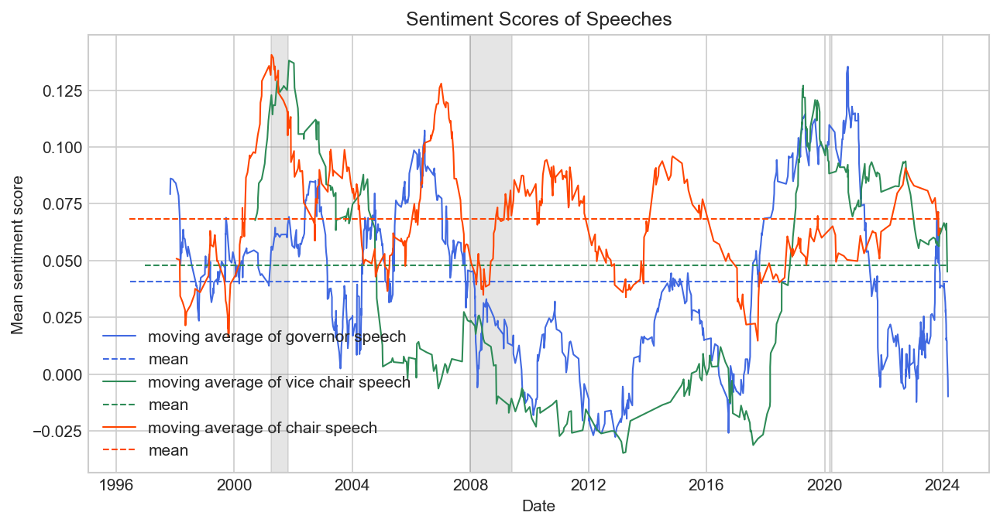

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

def plot_by_type(s_type, speech_frame, l_color, scatter = False):
    frame = speech_frame[(speech_frame.Type == s_type)]
    date = frame["Date"]
    speech_score = frame["mean score"]
    rolling_mean = speech_score.rolling(window = 30).mean()
    mean = [speech_score.mean()]*len(date)

    plt.plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average of " + s_type + " speech", color = l_color)
    plt.plot(date, mean, linestyle = "--", linewidth = 1, label = "mean", color = l_color)
    if scatter == True:
        plt.scatter(date, speech_score, marker = ".", s = 30, c = l_color, label = "actual score of " + s_type + " speech")


plot_by_type("governor", speech_frame, "royalblue")
plot_by_type("vice chair", speech_frame, "seagreen")
plot_by_type("chair", speech_frame, "orangered")

plt.legend()
plt.ylabel("Mean sentiment score")
plt.xlabel("Date")
plt.title("Sentiment Scores of Speeches")

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

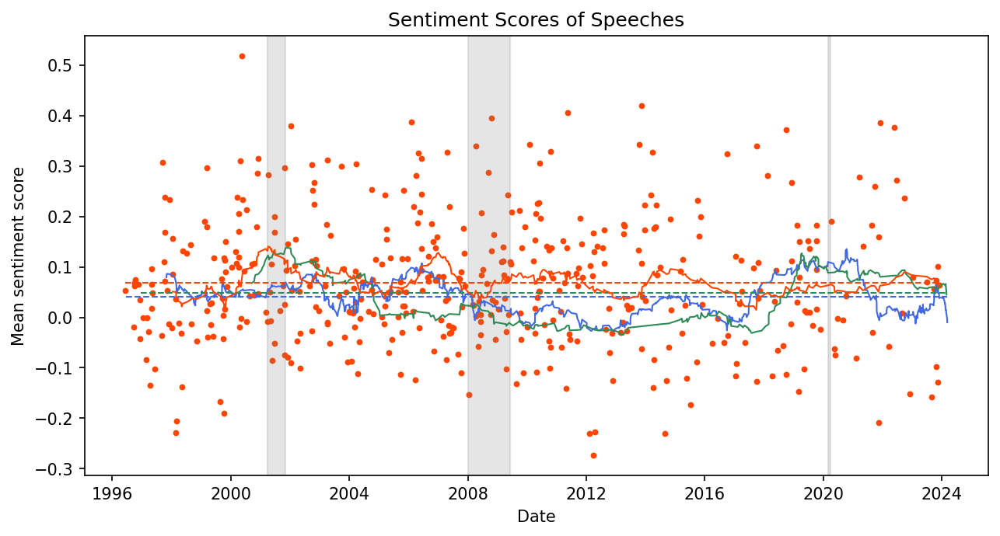

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

def plot_by_type(s_type, speech_frame, l_color, scatter = False):
    frame = speech_frame[(speech_frame.Type == s_type)]
    date = frame["Date"]
    speech_score = frame["mean score"]
    rolling_mean = speech_score.rolling(window = 30).mean()
    mean = [speech_score.mean()]*len(date)

    plt.plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average of " + s_type + " speech", color = l_color)
    plt.plot(date, mean, linestyle = "--", linewidth = 1, label = "mean", color = l_color)
    if scatter == True:
        plt.scatter(date, speech_score, marker = ".", s = 30, c = l_color, label = "actual score of " + s_type + " speech")


plot_by_type("governor", speech_frame, "royalblue")
plot_by_type("vice chair", speech_frame, "seagreen")
plot_by_type("chair", speech_frame, "orangered", scatter = True)


plt.ylabel("Mean sentiment score")
plt.xlabel("Date")
plt.title("Sentiment Scores of Speeches")

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

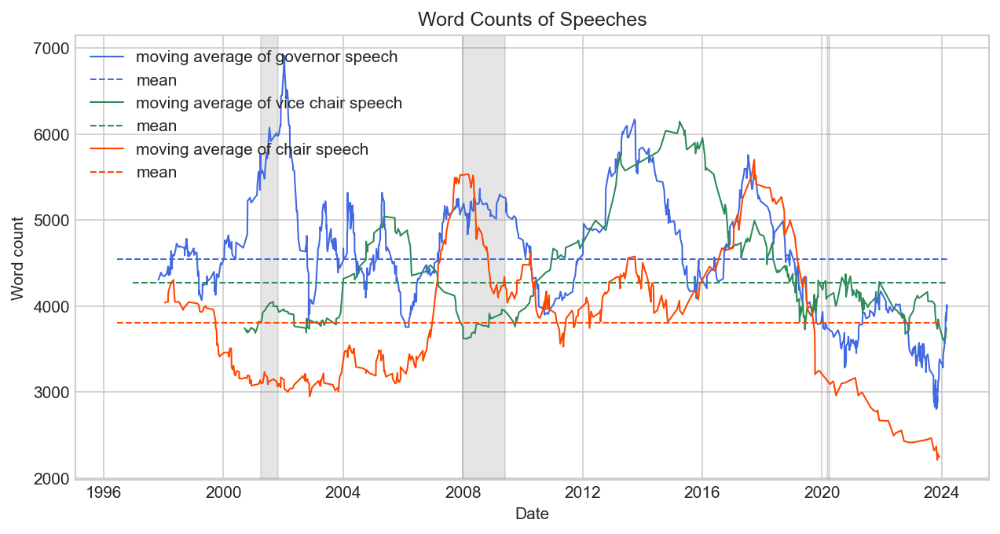

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

def plot_by_type(s_type, speech_frame, l_color, scatter = False):
    frame = speech_frame[(speech_frame.Type == s_type)]
    date = frame["Date"]
    speech_score = frame["Speech wordnum"]
    rolling_mean = speech_score.rolling(window = 30).mean()
    mean = [speech_score.mean()]*len(date)

    plt.plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average of " + s_type + " speech", color = l_color)
    plt.plot(date, mean, linestyle = "--", linewidth = 1, label = "mean", color = l_color)
    if scatter == True:
        plt.scatter(date, speech_score, marker = ".", s = 30, c = l_color, label = "actual score of " + s_type + " speech")


plot_by_type("governor", speech_frame, "royalblue")
plot_by_type("vice chair", speech_frame, "seagreen")
plot_by_type("chair", speech_frame, "orangered")

plt.legend()
plt.ylabel("Word count")
plt.xlabel("Date")
plt.title("Word Counts of Speeches")

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

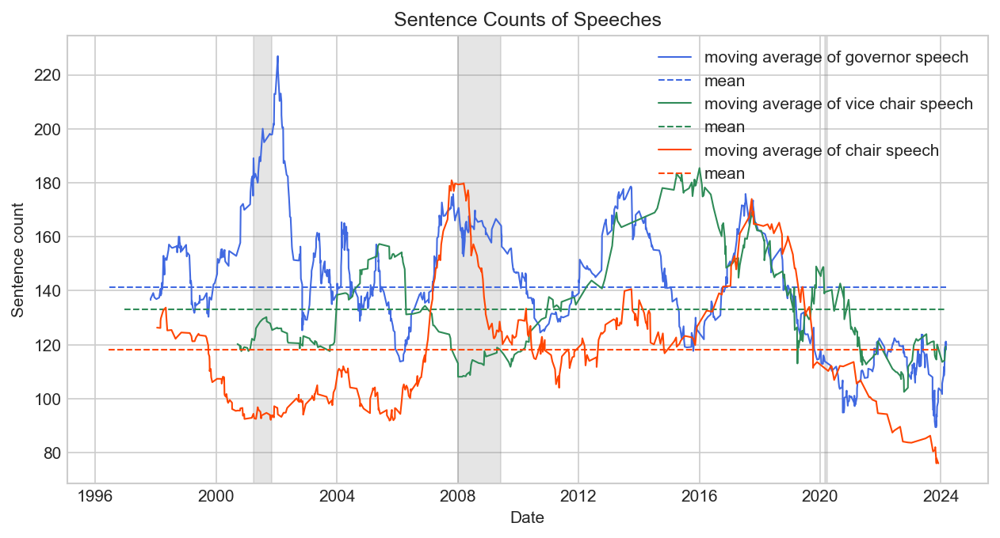

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

def plot_by_type(s_type, speech_frame, l_color, scatter = False):
    frame = speech_frame[(speech_frame.Type == s_type)]
    date = frame["Date"]
    speech_score = frame["Speech sentnum"]
    rolling_mean = speech_score.rolling(window = 30).mean()
    mean = [speech_score.mean()]*len(date)

    plt.plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average of " + s_type + " speech", color = l_color)
    plt.plot(date, mean, linestyle = "--", linewidth = 1, label = "mean", color = l_color)
    if scatter == True:
        plt.scatter(date, speech_score, marker = ".", s = 30, c = l_color, label = "actual score of " + s_type + " speech")


plot_by_type("governor", speech_frame, "royalblue")
plot_by_type("vice chair", speech_frame, "seagreen")
plot_by_type("chair", speech_frame, "orangered")

plt.legend()
plt.ylabel("Sentence count")
plt.xlabel("Date")
plt.title("Sentence Counts of Speeches")

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

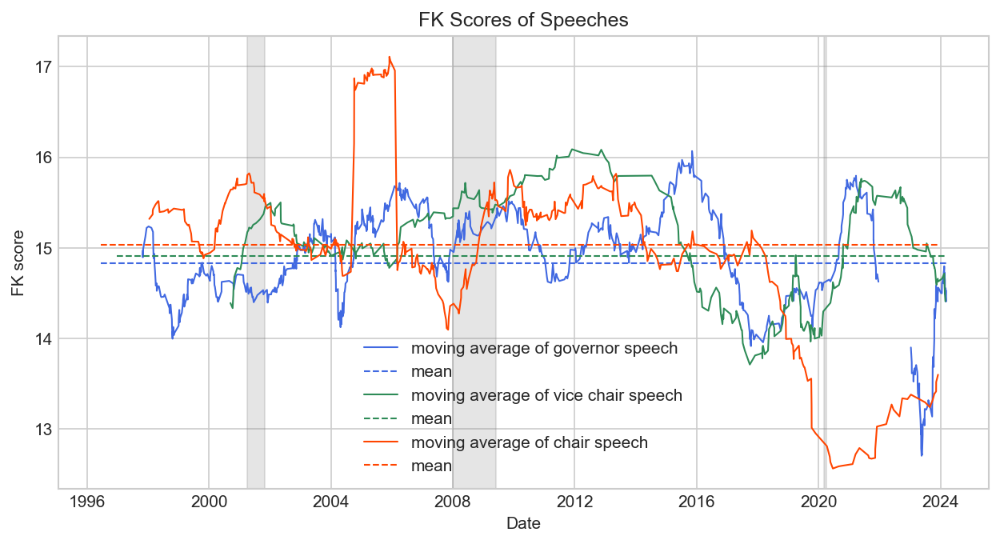

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

def plot_by_type(s_type, speech_frame, l_color, scatter = False):
    frame = speech_frame[(speech_frame.Type == s_type)]
    date = frame["Date"]
    speech_score = frame["FK score"]
    rolling_mean = speech_score.rolling(window = 30).mean()
    mean = [speech_score.mean()]*len(date)

    plt.plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average of " + s_type + " speech", color = l_color)
    plt.plot(date, mean, linestyle = "--", linewidth = 1, label = "mean", color = l_color)
    if scatter == True:
        plt.scatter(date, speech_score, marker = ".", s = 30, c = l_color, label = "actual score of " + s_type + " speech")


plot_by_type("governor", speech_frame, "royalblue")
plot_by_type("vice chair", speech_frame, "seagreen")
plot_by_type("chair", speech_frame, "orangered")

plt.legend()
plt.ylabel("FK score")
plt.xlabel("Date")
plt.title("FK Scores of Speeches")

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

In [ ]:
frame = speech_frame[(speech_frame.Type == "chair")]
pd.pivot_table(frame, index = "Governor", aggfunc = np.mean)

,FK score,Hawishness,Speech negative sentences,Speech neutral sentences,Speech positive sentences,Speech sentnum,Speech wordnum,mean score
Governor,,,,,,,,
Chair Janet L. Yellen,14.862315,-0.061086,28.116279,96.534884,22.302326,146.953488,4880.558140,0.048572
Chair Jerome H. Powell,13.321145,0.001657,16.431818,54.295455,15.931818,86.659091,2496.113636,0.060968
Chair Pro Tempore Jerome H. Powell,13.279926,0.586207,42.000000,47.000000,36.000000,125.000000,3816.000000,-0.057911
Chairman Ben S. Bernanke,15.955084,NaN,16.000000,67.000000,7.000000,90.000000,3388.000000,-0.061599
Chairman Alan Greenspan,15.456772,0.044129,21.210811,60.416216,23.767568,105.394595,3410.583784,0.067009
Chairman Ben S. Bernanke,15.226302,-0.069882,22.077381,85.589286,25.279762,132.946429,4347.309524,0.077780
Chairman Jerome H. Powell,12.784442,-0.003037,20.923077,80.615385,19.692308,121.230769,3399.769231,0.077322


In [ ]:
frame = speech_frame[(speech_frame.Type == "chair")]
frame.replace("Chair Pro Tempore Jerome H. Powell","Chair Jerome H. Powell", inplace = True)
frame.replace("Chairman Jerome H. Powell","Chair Jerome H. Powell", inplace = True)
frame.replace("Chairman  Ben S. Bernanke","Chairman Ben S. Bernanke", inplace = True)
pd.pivot_table(frame, index = "Governor", aggfunc = np.mean)

C:\Users\huohh\AppData\Local\Temp\ipykernel_34288\3004166741.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame.replace("Chair Pro Tempore Jerome H. Powell","Chair Jerome H. Powell", inplace = True)
C:\Users\huohh\AppData\Local\Temp\ipykernel_34288\3004166741.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame.replace("Chairman Jerome H. Powell","Chair Jerome H. Powell", inplace = True)
C:\Users\huohh\AppData\Local\Temp\ipykernel_34288\3004166741.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/

,FK score,Hawishness,Speech negative sentences,Speech neutral sentences,Speech positive sentences,Speech sentnum,Speech wordnum,mean score
Governor,,,,,,,,
Chair Janet L. Yellen,14.862315,-0.061086,28.116279,96.534884,22.302326,146.953488,4880.558140,0.048572
Chair Jerome H. Powell,13.200139,0.014655,17.879310,60.068966,17.120690,95.068966,2721.413793,0.062584
Chairman Alan Greenspan,15.456772,0.044129,21.210811,60.416216,23.767568,105.394595,3410.583784,0.067009
Chairman Ben S. Bernanke,15.230614,-0.069882,22.041420,85.479290,25.171598,132.692308,4341.633136,0.076955


In [ ]:
frame = speech_frame[(speech_frame.Type == "vice chair")]
pd.pivot_table(frame, index = "Governor", aggfunc = np.mean)

,FK score,Hawishness,Speech negative sentences,Speech neutral sentences,Speech positive sentences,Speech sentnum,Speech wordnum,mean score
Governor,,,,,,,,
Vice Chair Alice M. Rivlin,13.851259,0.215938,19.117647,72.000000,18.941176,110.058824,3498.235294,0.037430
Vice Chair Janet L. Yellen,15.653358,-0.277140,39.681818,105.454545,30.363636,175.500000,5945.954545,-0.007367
Vice Chair Lael Brainard,15.882457,0.030481,19.555556,49.444444,15.333333,84.333333,3174.777778,0.015098
Vice Chair Philip N. Jefferson,12.345821,0.348974,16.200000,91.000000,10.600000,117.800000,3138.600000,0.014050
Vice Chair Richard H. Clarida,14.997481,-0.119918,11.589744,115.333333,15.000000,141.923077,4426.717949,0.064545
Vice Chair for Supervision Michael S. Barr,14.582266,-0.157143,13.750000,94.250000,18.100000,126.100000,3939.950000,0.087609
Vice Chair for Supervision Randal K. Quarles,14.781133,-0.232198,14.961538,84.500000,22.846154,122.307692,4034.730769,0.098199
Vice Chair for Supervision and Chair of the Financial Stability Board Randal K. Quarles,13.927531,NaN,9.714286,66.571429,26.000000,102.285714,3194.428571,0.187940
Vice Chairman Donald L. Kohn,15.637942,-0.167278,29.717391,65.173913,23.347826,118.239130,4023.717391,-0.019650


In [ ]:
frame = speech_frame[(speech_frame.Type == "governor")]
frame.describe()

,Speech wordnum,Speech sentnum,mean score,Speech positive sentences,Speech negative sentences,Speech neutral sentences,FK score,Hawishness
count,901.000000,901.00000,901.000000,901.000000,901.000000,901.000000,900.000000,471.000000
mean,4549.420644,141.18091,0.040617,23.729190,23.495006,93.956715,14.830757,-0.017253
std,2100.290141,67.08389,0.115093,13.072274,17.488956,55.898850,1.669092,0.540426
min,59.000000,1.00000,-0.332615,0.000000,0.000000,1.000000,6.884125,-1.000000
25%,3351.000000,103.00000,-0.034257,14.000000,10.000000,59.000000,13.704578,-0.279221
50%,4358.000000,132.00000,0.038071,22.000000,20.000000,84.000000,14.904518,0.000000
75%,5508.000000,170.00000,0.109278,31.000000,33.000000,117.000000,16.024916,0.233566
max,18990.000000,600.00000,0.403461,78.000000,127.000000,499.000000,19.726646,1.000000


In [ ]:
frame = speech_frame[(speech_frame.Type == "chair")]
frame.describe()

,Speech wordnum,Speech sentnum,mean score,Speech positive sentences,Speech negative sentences,Speech neutral sentences,FK score,Hawishness
count,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,239.000000
mean,3807.472527,118.145055,0.068397,23.303297,21.747253,73.094505,15.028932,-0.016737
std,2199.016949,71.834189,0.126889,14.025790,18.034960,56.010559,2.889298,0.602627
min,249.000000,9.000000,-0.273686,1.000000,0.000000,5.000000,8.982783,-1.000000
25%,2165.500000,66.500000,-0.015983,12.000000,7.000000,35.500000,14.027922,-0.333333
50%,3646.000000,110.000000,0.056614,23.000000,18.000000,60.000000,15.035872,-0.058824
75%,5087.000000,155.500000,0.141180,32.000000,31.000000,92.500000,15.986552,0.279221
max,14694.000000,460.000000,0.518603,85.000000,88.000000,431.000000,57.217864,1.000000


In [ ]:
frame = speech_frame[(speech_frame.Type == "vice chair")]
frame.describe()

,Speech wordnum,Speech sentnum,mean score,Speech positive sentences,Speech negative sentences,Speech neutral sentences,FK score,Hawishness
count,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,217.000000
mean,4277.180282,133.078873,0.047881,22.642254,21.436620,89.000000,14.906026,-0.140258
std,2042.534230,74.676246,0.121019,12.670483,16.795826,67.593584,1.714354,0.501942
min,686.000000,18.000000,-0.471196,2.000000,0.000000,11.000000,9.740991,-1.000000
25%,2940.000000,88.500000,-0.030909,13.000000,9.000000,47.000000,14.031180,-0.375000
50%,4086.000000,123.000000,0.040767,21.000000,17.000000,72.000000,14.947035,-0.176471
75%,5099.000000,155.000000,0.127040,30.000000,29.000000,104.000000,15.971162,0.103448
max,15226.000000,642.000000,0.475602,95.000000,82.000000,521.000000,19.886553,1.000000


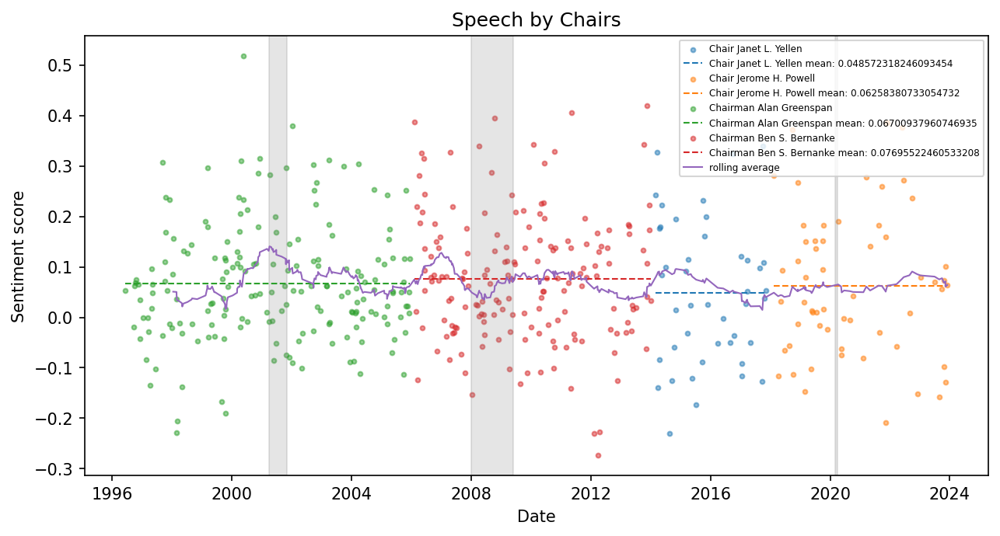

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

group_by = frame.groupby("Governor")

for name, group in group_by:
    score = group["mean score"]
    date = group["Date"]
    mean = [score.mean()]*len(group["Date"])
    plt.scatter(date, score, marker = ".", s = 30, label = name, alpha=0.5)
    plt.plot(date, mean, linestyle = "--", linewidth = 1, label = name + " mean: " + str(score.mean()))

rolling_mean = frame["mean score"].rolling(window = 30).mean()
date = frame["Date"]
plt.plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "rolling average")

plt.legend(loc = "best", fontsize = "xx-small")
plt.ylabel("Sentiment score")
plt.xlabel("Date")
plt.title("Speech by Chairs")

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

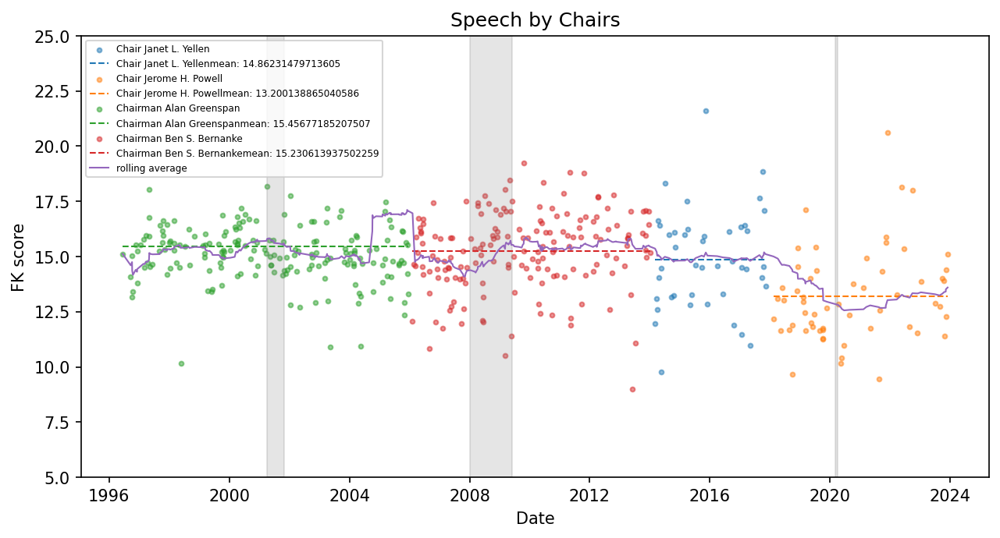

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

group_by = frame.groupby("Governor")

for name, group in group_by:
    score = group["FK score"]
    date = group["Date"]
    mean = [score.mean()]*len(group["Date"])
    plt.scatter(date, score, marker = ".", s = 30, label = name, alpha=0.5)
    plt.plot(date, mean, linestyle = "--", linewidth = 1, label = name + "mean: " + str(score.mean()))

rolling_mean = frame["FK score"].rolling(window = 30, min_periods = 1).mean()
date = frame["Date"]
plt.plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "rolling average")

plt.legend(loc = "best", fontsize = "xx-small")
plt.ylabel("FK score")
plt.ylim(5,25)
plt.xlabel("Date")
plt.title("Speech by Chairs")

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

Comparison between mean sentiment scores of four types of FOMC text (statements, minutes, transcripts, and speeches)

Text(0.5, 1.0, 'Speech and FOMC text')

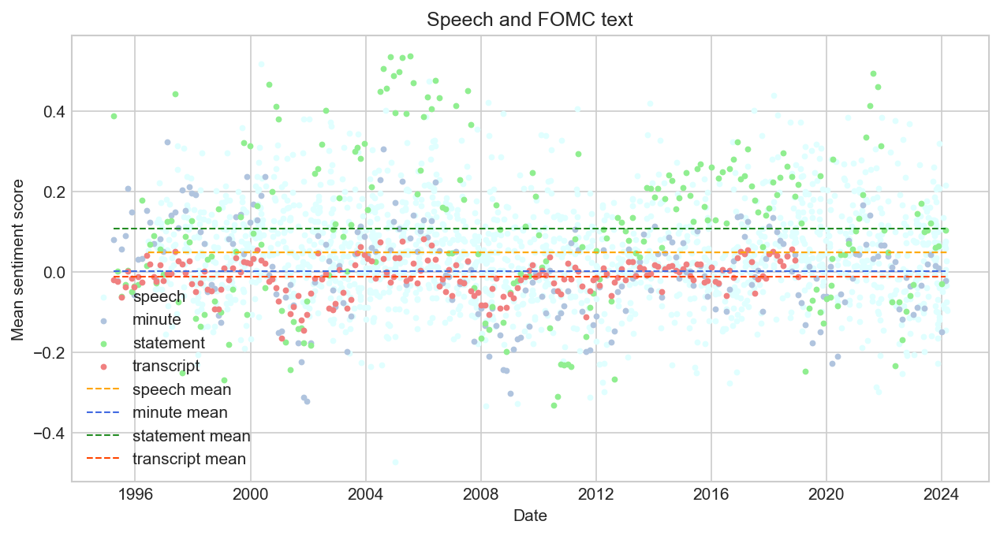

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

speech_date = speech_frame["Date"]
speech_mean = [speech_score.mean()]*len(speech_date)
rolling_mean = speech_score.rolling(window = 30).mean()

minute_date = minute_frame["Minute date"]
minute_score = minute_frame["Minute mean score"]
statement_score = minute_frame["Statement mean score"]
transcript_score = minute_frame["Transcript mean score"]
minute_mean = [minute_score.mean()]*len(minute_date)
statement_mean = [statement_score.mean()]*len(minute_date)
transcript_mean = [transcript_score.mean()]*len(minute_date)

plt.scatter(speech_date, speech_score, marker = ".", s = 30, label = "speech", color = "lightcyan")
plt.scatter(minute_date, minute_score, marker = ".", s = 30, label = "minute", color = "lightsteelblue")
plt.scatter(minute_date, statement_score, marker = ".", s = 30, label = "statement", color = "lightgreen")
plt.scatter(minute_date, transcript_score, marker = ".", s = 30, label = "transcript", color = "lightcoral")

plt.plot(speech_date, speech_mean, linestyle = "--", linewidth = 1, label = "speech mean", color = "orange")
plt.plot(minute_date, minute_mean, linestyle = "--", linewidth = 1, label = "minute mean", color = "royalblue")
plt.plot(minute_date, statement_mean, linestyle = "--", linewidth = 1, label = "statement mean", color = "forestgreen")
plt.plot(minute_date, transcript_mean, linestyle = "--", linewidth = 1, label = "transcript mean", color = "orangered")

plt.legend()
plt.ylabel("Mean sentiment score")
plt.xlabel("Date")
plt.title("Speech and FOMC text")

Moving average of all four types of FOMC text (statements, minutes, transcripts, and speeches)

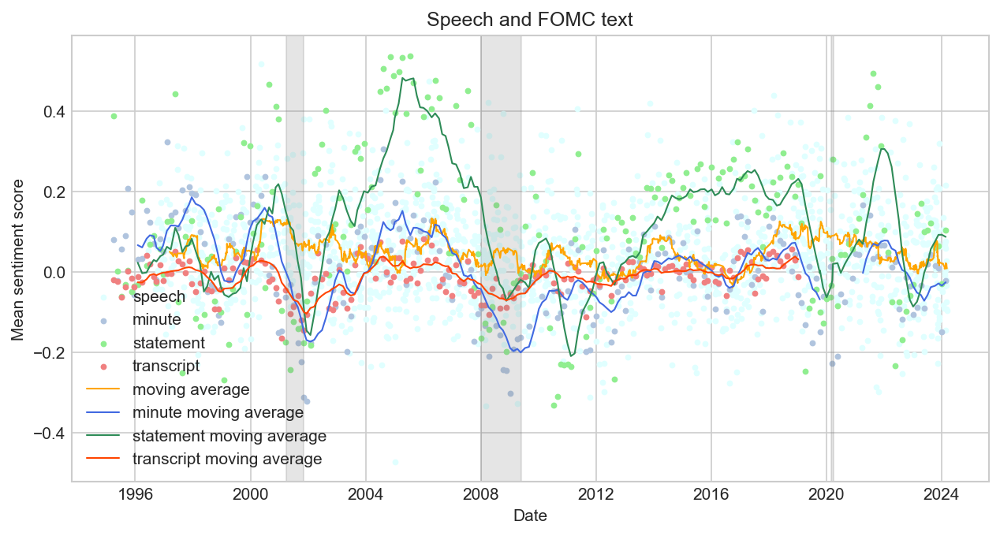

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

speech_date = speech_frame["Date"]
speech_mean = [speech_score.mean()]*len(speech_date)
rolling_mean = speech_score.rolling(window = 30).mean()

minute_date = minute_frame["Minute date"]
minute_score = minute_frame["Minute mean score"]
statement_score = minute_frame["Statement mean score"]
transcript_score = minute_frame["Transcript mean score"]
minute_rolling_mean = minute_score.rolling(window = 8).mean()
statement_rolling_mean = statement_score.rolling(window = 8).mean()
transcript_rolling_mean = transcript_score.rolling(window = 8).mean()

plt.scatter(speech_date, speech_score, marker = ".", s = 30, label = "speech", color = "lightcyan")
plt.scatter(minute_date, minute_score, marker = ".", s = 30, label = "minute", color = "lightsteelblue")
plt.scatter(minute_date, statement_score, marker = ".", s = 30, label = "statement", color = "lightgreen")
plt.scatter(minute_date, transcript_score, marker = ".", s = 30, label = "transcript", color = "lightcoral")

plt.plot(speech_date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average", color = "orange")
plt.plot(minute_date, minute_rolling_mean, linestyle = "-", markersize = 6, linewidth = 1, label = "minute moving average", color = "royalblue")
plt.plot(minute_date, statement_rolling_mean, linestyle = "-", markersize = 6, linewidth = 1, label = "statement moving average", color = "seagreen")
plt.plot(minute_date, transcript_rolling_mean, linestyle = "-", markersize = 6, linewidth = 1, label = "transcript moving average", color = "orangered")

plt.legend()
plt.ylabel("Mean sentiment score")
plt.xlabel("Date")
plt.title("Speech and FOMC text")

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

Plot of the sentiment score difference between statement and minute over time. The red points represent the sentiment score of statements and the blue points represent the sentiment score of minutes. The vertical line between each point represents the sentiment score difference. When the difference is positive (statement > minute), the line is red. When the difference is negative (statement < minute), the line is blue.

c:\Users\huohh\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\axes\_base.py:2480: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


Text(0.5, 1.0, 'FOMC text')

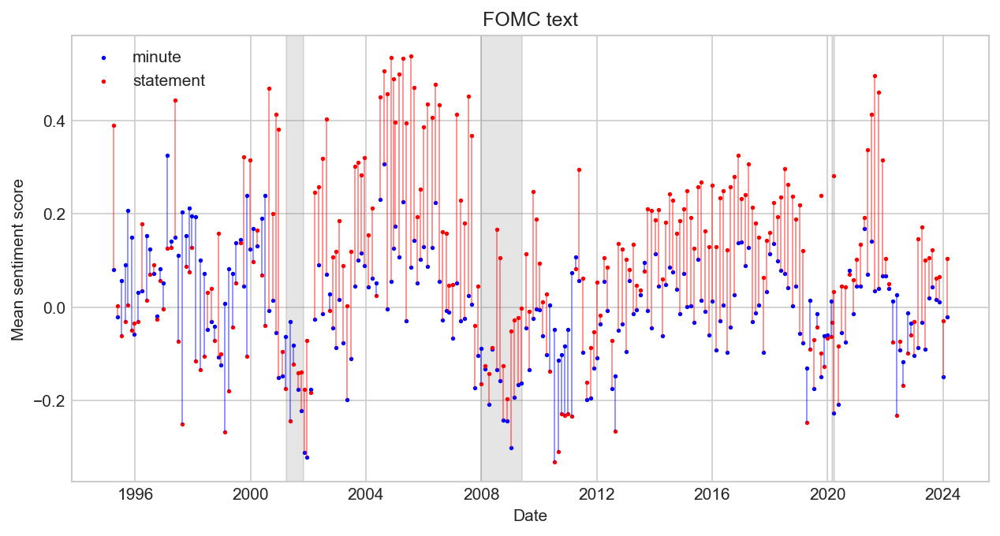

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

date = minute_frame["Minute date"]
minute_score = minute_frame["Minute mean score"]
statement_score = minute_frame["Statement mean score"]

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

for comb in zip(date, minute_score, statement_score):
    if comb[1] >= comb[2]:
        colors = "blue"
    else:
        colors = "red"
    plt.vlines(comb[0], ymin=min(comb[1], comb[2]), ymax=max(comb[1], comb[2]), linewidth = 0.8, color = colors, alpha = 0.5)

plt.scatter(date, minute_score, marker = ".", s = 10, label = "minute", color = "blue")
plt.scatter(date, statement_score, marker = ".", s = 10, label = "statement", color = "red")

plt.legend()
plt.ylabel("Mean sentiment score")
plt.xlabel("Date")
plt.title("FOMC text")

Plot of the sentiment score difference between statement and minute over time, with mean and rolling average (window size = 8).

Text(0.5, 1.0, 'Statement and minute sentiment score difference')

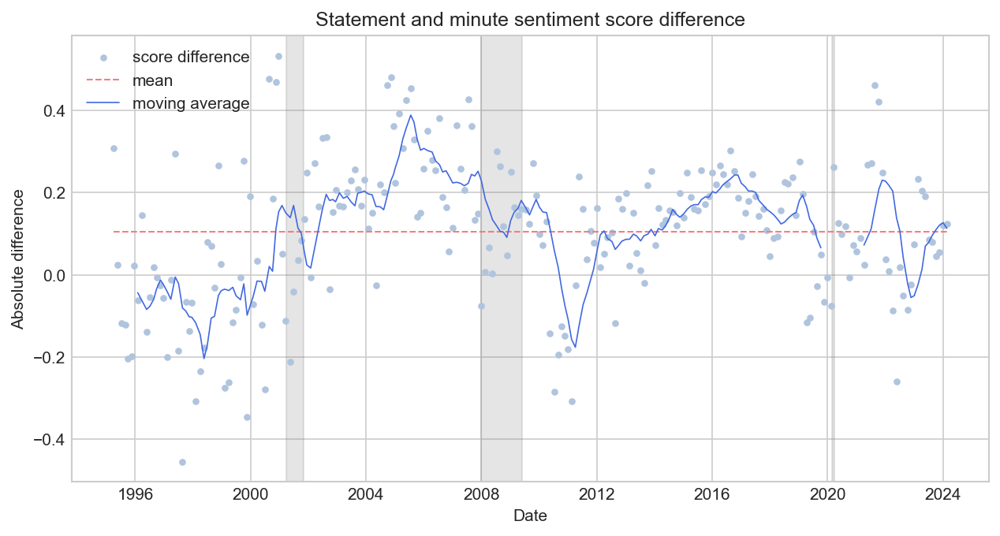

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

date = minute_frame["Minute date"]
minute_score = minute_frame["Minute mean score"]
statement_score = minute_frame["Statement mean score"]
diff = statement_score - minute_score
mean = [diff.mean()]*len(date)
rolling_mean = diff.rolling(window = 8).mean()

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

plt.scatter(date, diff, marker = "o", s = 10, label = "score difference", color = "lightsteelblue")
plt.plot(date, mean, linestyle = "--", linewidth = 1, label = "mean", color = "lightcoral")
plt.plot(date, rolling_mean, linestyle = "-", linewidth = 0.8, label = "moving average", color = "royalblue")

plt.legend()
plt.ylabel("Absolute difference")
plt.xlabel("Date")
plt.title("Statement and minute sentiment score difference")

In [ ]:
minute_prediction = pd.read_json("C:/Users/huohh/Desktop/Central bank communication/prediction.json")
speech_prediction = pd.read_json("C:/Users/huohh/Desktop/Central bank communication/speech_prediction.json")

In [ ]:
minute_prediction.head()

,minute_logit_list,statement_logit_list,transcript_logit_list,minute_label_list,statement_label_list,transcript_label_list,minute_score_list,statement_score_list,Minute mean score,Statement mean score,Transcript mean score
0,"[[[0.0177829321, 0.059371341, 0.9228456616]], ...","[[[0.6748194695, 0.018643649300000002, 0.30653...","[[[0.0210844427, 0.037209641200000004, 0.94170...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[0, 2, 0, 0, 2, 2, 2]","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[-0.0415884107, -0.0179325249, -0.02425077, -0...","[0.6561757922, 0.3970226049, 0.9332819581, 0.7...",0.080507,0.388746,-0.019798
1,"[[[0.0194038618, 0.06543226540000001, 0.915163...",None,"[[[0.0211116262, 0.061927009400000003, 0.91696...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...",None,"[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[-0.0460284054, 0.0001872368, -0.0322612077, -...",None,-0.021055,NaN,-0.023549
2,"[[[0.0193902887, 0.06486635660000001, 0.915743...",None,"[[[0.020842744, 0.062414486000000005, 0.916742...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 1, ...",None,"[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[-0.0454760678, -0.018092975, 0.0116532929, 0....",None,0.057078,NaN,-0.061208
3,"[[[0.0176372994, 0.057296101, 0.9250666499]], ...","[[[0.1150300652, 0.1541737169, 0.7307962179]],...","[[[0.019056256900000002, 0.0549809746, 0.92596...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 1, 0, 1, ...","[2, 0, 1, 2]","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[-0.0396587998, -0.029917694600000003, -0.0185...","[-0.039143651700000004, 0.9041860700000001, -0...",0.090347,-0.030123,-0.036084
4,"[[[0.0195594877, 0.0649136081, 0.9155268073]],...",None,"[[[0.0210484415, 0.0629355684, 0.916015923]], ...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 0, ...",None,"[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[-0.0453541204, -0.015060540300000001, 0.00393...",None,0.207942,NaN,0.001658


In [ ]:
speech_prediction.head()

,logit_list,label_list,score_list,mean score
0,"[[[0.3577295244, 0.012383131300000001, 0.62988...","[2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, ...","[0.3453463912, 0.1503828764, 0.7598264217, 0.1...",0.053503
1,"[[[0.0499975085, 0.01920777, 0.930794715900000...","[2, 2, 1, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, ...","[0.0307897385, 0.12111815070000001, -0.9520249...",0.076873
2,"[[[0.0950520188, 0.0178739782, 0.8870739937000...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, ...","[0.0771780387, 0.28540241720000004, 0.01373521...",-0.041891
3,"[[[0.0662664995, 0.0168708656, 0.9168626070000...","[2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 0, 2, 2, 2, ...","[0.0493956357, 0.0928940624, 0.2588640153, 0.0...",-0.019191
4,"[[[0.0623571724, 0.0240529999, 0.9135898948000...","[2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[0.038304172500000004, -0.047805033600000005, ...",0.125150


Box plot of sentiment score, which is calculated on a sentence level, for each FOMC minute.

<Axes: xlabel='date', ylabel='score'>

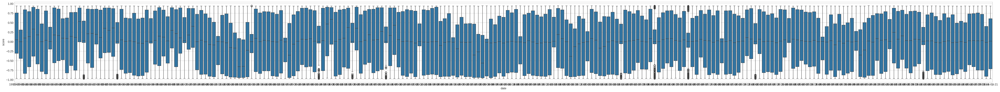

In [ ]:
minute_score_list = list()

i = 0
for score_list in minute_prediction["minute_score_list"]:
    if type(score_list) == list:
        for sent_score in score_list:
            minute_score_list.append({"date":minute_frame["Minute date"][i], "score":sent_score})
    i += 1
minute_score_frame = pd.DataFrame(minute_score_list)

fig = plt.figure(figsize = (60,5),dpi = 300)
seaborn.boxplot(data = minute_score_frame, y = "score",x = "date")

Box plot of sentiment score, which is calculated on a sentence level, for each FOMC statement.

<AxesSubplot:xlabel='date', ylabel='score'>

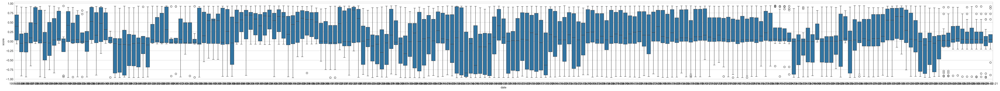

In [ ]:
statement_score_list = list()

i = 0
for score_list in minute_prediction["statement_score_list"]:
    if type(score_list) == list:
        for sent_score in score_list:
            statement_score_list.append({"date":minute_frame["Minute date"][i], "score":sent_score})
    i += 1
statement_score_frame = pd.DataFrame(statement_score_list)

fig = plt.figure(figsize = (60,5),dpi = 300)
seaborn.boxplot(data = statement_score_frame, y = "score",x = "date")

A simplified box plot of sentiment score for each FOMC minute.Red points represent the third quantile of sentiment score in FOMC minutes. Blue points represent the median. Green points represent the first quantile.

c:\Users\huohh\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\axes\_base.py:2480: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


Text(0.5, 1.0, 'Minutes')

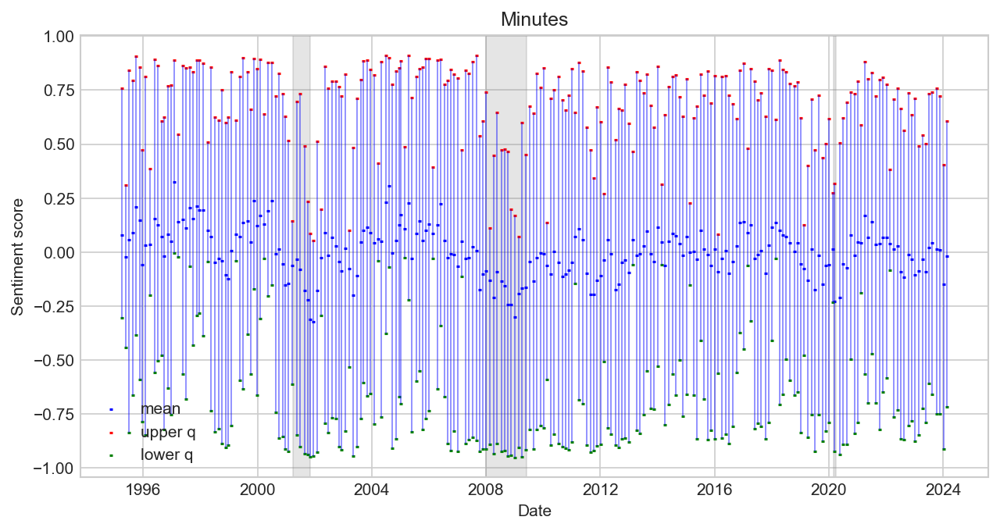

In [ ]:
minute_score_list = list()

i = 0
for score_list in minute_prediction["minute_score_list"]:
    if type(score_list) == list:
        score_series = pd.Series(score_list)
        minute_score_list.append({"upq":score_series.quantile(0.75), "lowq":score_series.quantile(0.25)})
    else:
        minute_score_list.append({"upq":np.nan, "lowq":np.nan})
    i += 1
minute_score_frame = pd.DataFrame(minute_score_list)

fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

date = minute_frame["Minute date"]
minute_score = minute_frame["Minute mean score"]
upq = minute_score_frame["upq"]
lowq = minute_score_frame["lowq"]

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

for comb in zip(date, upq, lowq):
    plt.vlines(comb[0], ymin=comb[2], ymax=comb[1], linewidth = 0.8, color = "blue", alpha = 0.5)

plt.scatter(date, minute_score, marker = "_", s = 5, color = "blue", label = "mean")
plt.scatter(date, upq, marker = "_", s = 5, color = "red", label = "upper q")
plt.scatter(date, lowq, marker = "_", s = 5, color = "green", label = "lower q")

plt.legend()
plt.ylabel("Sentiment score")
plt.xlabel("Date")
plt.title("Minutes")

A simplified box plot of sentiment score for each FOMC statement.Red points represent the third quantile of sentiment score in FOMC statements. Blue points represent the median. Green points represent the first quantile.

c:\Users\huohh\AppData\Local\Programs\Python\Python39\lib\site-packages\matplotlib\axes\_base.py:2480: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


Text(0.5, 1.0, 'FOMC text')

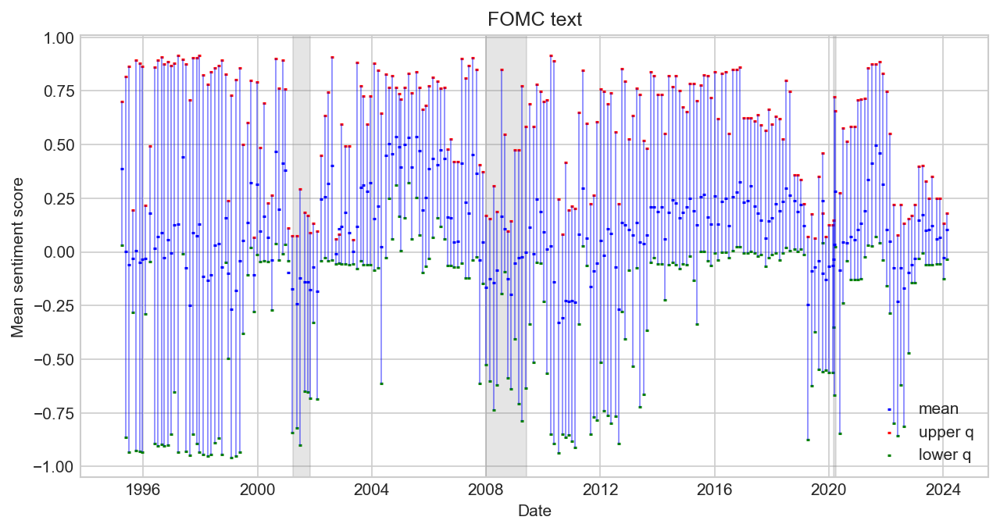

In [ ]:
statement_score_list = list()

i = 0
for score_list in minute_prediction["statement_score_list"]:
    if type(score_list) == list:
        score_series = pd.Series(score_list)
        statement_score_list.append({"upq":score_series.quantile(0.75), "lowq":score_series.quantile(0.25)})
    else:
        statement_score_list.append({"upq":np.nan, "lowq":np.nan})
    i += 1
statement_score_frame = pd.DataFrame(statement_score_list)

fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

date = minute_frame["Minute date"]
statement_score = minute_frame["Statement mean score"]
upq = statement_score_frame["upq"]
lowq = statement_score_frame["lowq"]

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

for comb in zip(date, upq, lowq):
    plt.vlines(comb[0], ymin=comb[2], ymax=comb[1], linewidth = 0.8, color = "blue", alpha = 0.5)

plt.scatter(date, statement_score, marker = "_", s = 5, color = "blue", label = "mean")
plt.scatter(date, upq, marker = "_", s = 5, color = "red", label = "upper q")
plt.scatter(date, lowq, marker = "_", s = 5, color = "green", label = "lower q")

plt.legend()
plt.ylabel("Mean sentiment score")
plt.xlabel("Date")
plt.title("FOMC text")

A scatter plot of the count of positive sentences in minutes and statements over time, with moving averages.

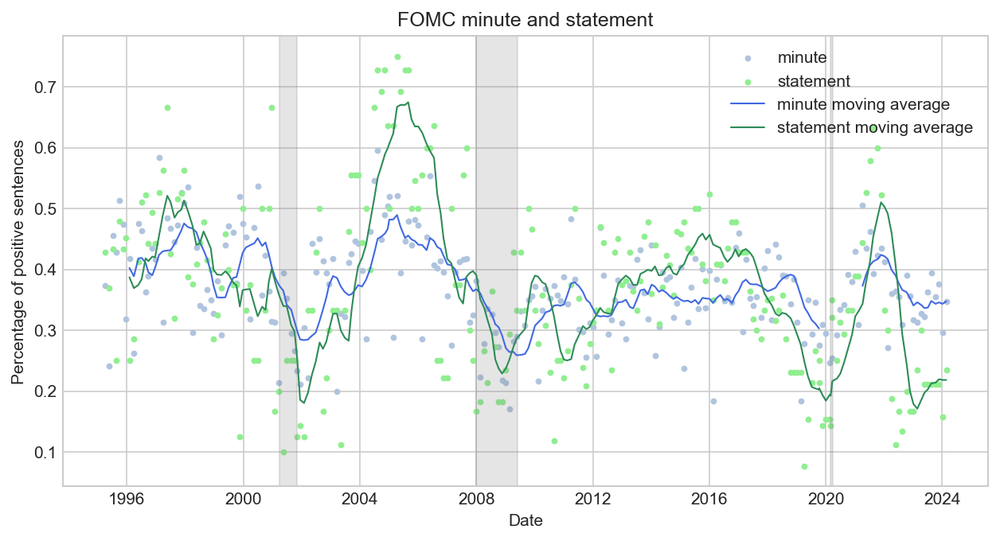

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

date = minute_frame["Minute date"]
minute_positive = minute_frame["Minute positive sentences"]/minute_frame["Minute sentnum"]
statement_positive = minute_frame["Statement positive sentences"]/minute_frame["Statement sentnum"]

minute_rolling_mean = minute_positive.rolling(window = 8).mean()
statement_rolling_mean = statement_positive.rolling(window = 8).mean()

plt.scatter(date, minute_positive, marker = ".", s = 30, label = "minute", color = "lightsteelblue")
plt.scatter(date, statement_positive, marker = ".", s = 30, label = "statement", color = "lightgreen")

plt.plot(date, minute_rolling_mean, linestyle = "-", markersize = 6, linewidth = 1, label = "minute moving average", color = "royalblue")
plt.plot(date, statement_rolling_mean, linestyle = "-", markersize = 6, linewidth = 1, label = "statement moving average", color = "seagreen")

plt.legend()
plt.ylabel("Percentage of positive sentences")
plt.xlabel("Date")
plt.title("FOMC minute and statement")

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

A scatter plot of the count of negative sentences in minutes and statements over time, with moving averages.

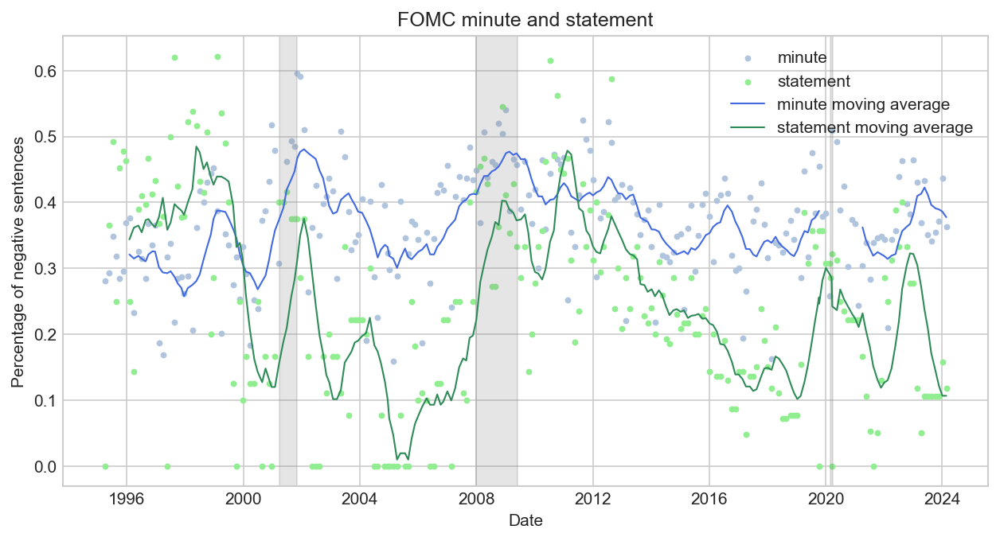

In [ ]:
fig = plt.figure(figsize = (10,5),dpi = 150)
ax = plt.axes()

date = minute_frame["Minute date"]
minute_negative = minute_frame["Minute negative sentences"]/minute_frame["Minute sentnum"]
statement_negative = minute_frame["Statement negative sentences"]/minute_frame["Statement sentnum"]

minute_rolling_mean = minute_negative.rolling(window = 8).mean()
statement_rolling_mean = statement_negative.rolling(window = 8).mean()

plt.scatter(date, minute_negative, marker = ".", s = 30, label = "minute", color = "lightsteelblue")
plt.scatter(date, statement_negative, marker = ".", s = 30, label = "statement", color = "lightgreen")

plt.plot(date, minute_rolling_mean, linestyle = "-", markersize = 6, linewidth = 1, label = "minute moving average", color = "royalblue")
plt.plot(date, statement_rolling_mean, linestyle = "-", markersize = 6, linewidth = 1, label = "statement moving average", color = "seagreen")

plt.legend()
plt.ylabel("Percentage of negative sentences")
plt.xlabel("Date")
plt.title("FOMC minute and statement")

for period in recession_period:
    plt.axvspan(period[0],period[1], color = "grey", alpha = 0.2)

a. **Named Entity Recognition (NER):**
NER is a process in NLP that can identify entities in text such as names of people, places, organizations, dates, and other specific information. For economic texts like FOMC documents, NER can be particularly useful for tracking:

Economic Indicators: Identify mentions of specific economic indicators (e.g., GDP growth, inflation rates, unemployment rates) to understand their significance in discussions.
Geopolitical Entities: Track mentions of countries, regions, and international institutions to analyze geopolitical considerations or impacts.
Policy Tools: Identify mentions of specific monetary policy tools (e.g., interest rate adjustments, quantitative easing) to assess policy stances or actions.
Customizing an NER model to recognize domain-specific entities relevant to monetary policy and economic discussions can enhance the depth of your analysis. Libraries like spaCy allow for the training of custom NER models on your specific dataset.

b. **Co-occurrence Analysis:**
This involves examining the co-occurrence of terms within a certain window of words or sentences to discover associations and patterns in the text. For FOMC documents, this can help in:

Identifying Policy Focus Areas: See which economic indicators, policy tools, or geopolitical factors are frequently discussed together, indicating areas of focus or concern.
Understanding Contextual Relationships: Analyze how the discussion of certain topics or entities changes over time or in response to specific events.
Revealing Implicit Connections: Uncover implicit connections between different economic or policy aspects that may not be immediately apparent.
Techniques like constructing a co-occurrence matrix or using network analysis tools can visualize these relationships, offering insights into the complex interplay of factors considered in FOMC meetings.

c. **Sentiment Analysis at the Entity Level:**
While general sentiment analysis provides an overall tone, performing sentiment analysis at the entity level can yield insights into how specific topics, economic indicators, or policy measures are viewed. For example, understanding whether discussions about inflation are predominantly negative, positive, or neutral can inform on the committee's concerns or optimism.

d. **Trend Analysis Using NER and Sentiment Scores:**
Combine NER and sentiment analysis to track how sentiment towards specific entities (like economic indicators or policy tools) changes over time. This can help in understanding evolving economic perspectives or policy stances within the FOMC.

e. **Predictive Modeling:**
Using the insights gained from NER, co-occurrence analysis, and sentiment analysis, predictive models can be developed to forecast future policy directions or economic outlooks based on the language used in FOMC documents. Machine learning models can be trained on historical data to predict outcomes or stances based on textual analysis.

Tools for Implementation:
spaCy: Offers robust support for NER and can be extended with custom training for specific entities.
NetworkX: Useful for network and graph analysis, especially in visualizing co-occurrence and relationships.
Pandas and Matplotlib/Seaborn: For data manipulation and visualizing trends over time.
Scikit-learn or TensorFlow/PyTorch: For building predictive models based on extracted features from the text analysis.

In [ ]:
minute_text["Date"] = pd.to_datetime(minute_text["Minute date"])
speech_text["Date"] = pd.to_datetime(speech_text["Date"])

In [ ]:
#this function passed a series of text and return a document matrix with TFID features
#each vector in the matrix represents the TFIDF word frequency vector of a text
#the return matrix is in pytroch tensor form
def TFIDF_matrix(ser_text):
    text_collection = ser_text.replace(np.nan, "")
    vectorizer = TfidfVectorizer()
    matrix1 = vectorizer.fit_transform(text_collection)
    matrix2 = matrix1.toarray()
    matrix3 = torch.from_numpy(matrix2)
    return matrix3


#this function calculate cosine similarity matrix between two TFID matrix
#the required inputs are two matrix (in pytorch tensor)
#the output is a similarity matrix (in pytorch tensor)
def cosine_similarity(matrix_a, matrix_b):
    result = matrix_a @ matrix_b.transpose(0,1)
    return result


#derive cosine similarity between two type of text collections
#required two text type in str
#returns cosine similarity matrix
def TFDIF_similarity(text_type1, text_type2, dataframe_text):
    Corpous = pd.concat([dataframe_text[text_type1], dataframe_text[text_type2]])
    ag_matrix = TFIDF_matrix(Corpous)
    first_matrix = ag_matrix[:248,:]
    second_matrix = ag_matrix[248:,:]
    similarity_matrix = cosine_similarity(first_matrix, second_matrix)
    return similarity_matrix

#plot heat map to display consince similarity between texts between different date
#required argument is tw0 text type in str
def plot_heatmap(text_type1, text_type2, dataframe_text, dataframe_output):
    similarity_matrix = TFDIF_similarity(text_type1, text_type2, dataframe_text)
    non_zero_num = torch.count_nonzero(similarity_matrix).item()
    tot_num = similarity_matrix.numel()
    min_v = similarity_matrix.quantile(1-(non_zero_num/tot_num))
    frame = pd.DataFrame(similarity_matrix.numpy())
    frame.index = dataframe_output["Minute date"]
    frame.columns = dataframe_output["Minute date"]
    seaborn.set_context({"figure.figsize":(12.5,10)})
    plt.figure(figsize = (12,10), dpi =120)
    plot = seaborn.heatmap(data = frame, cmap = "Blues", vmin = min_v)

    plt.title(f"Cosine similarity between {text_type1} and {text_type2}")
    plt.xlabel(f"Date of {text_type2}")
    plt.ylabel(f"Date of {text_type1}")
    plt.show()

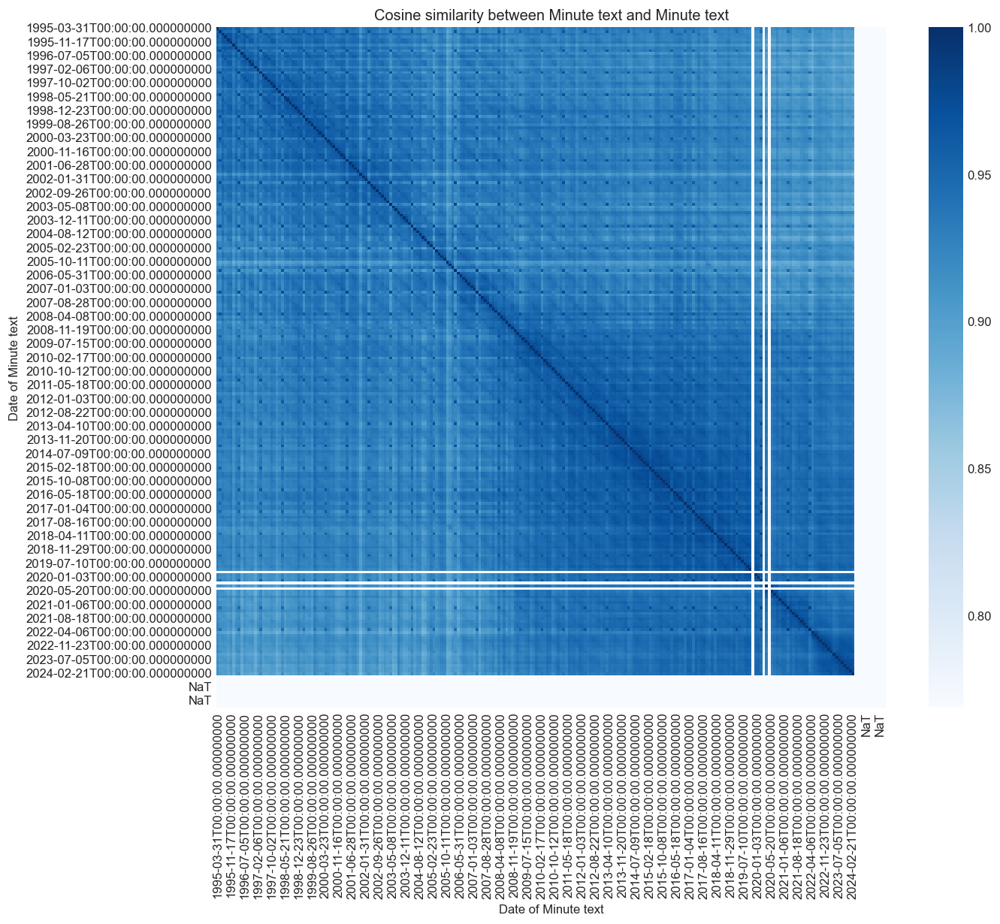

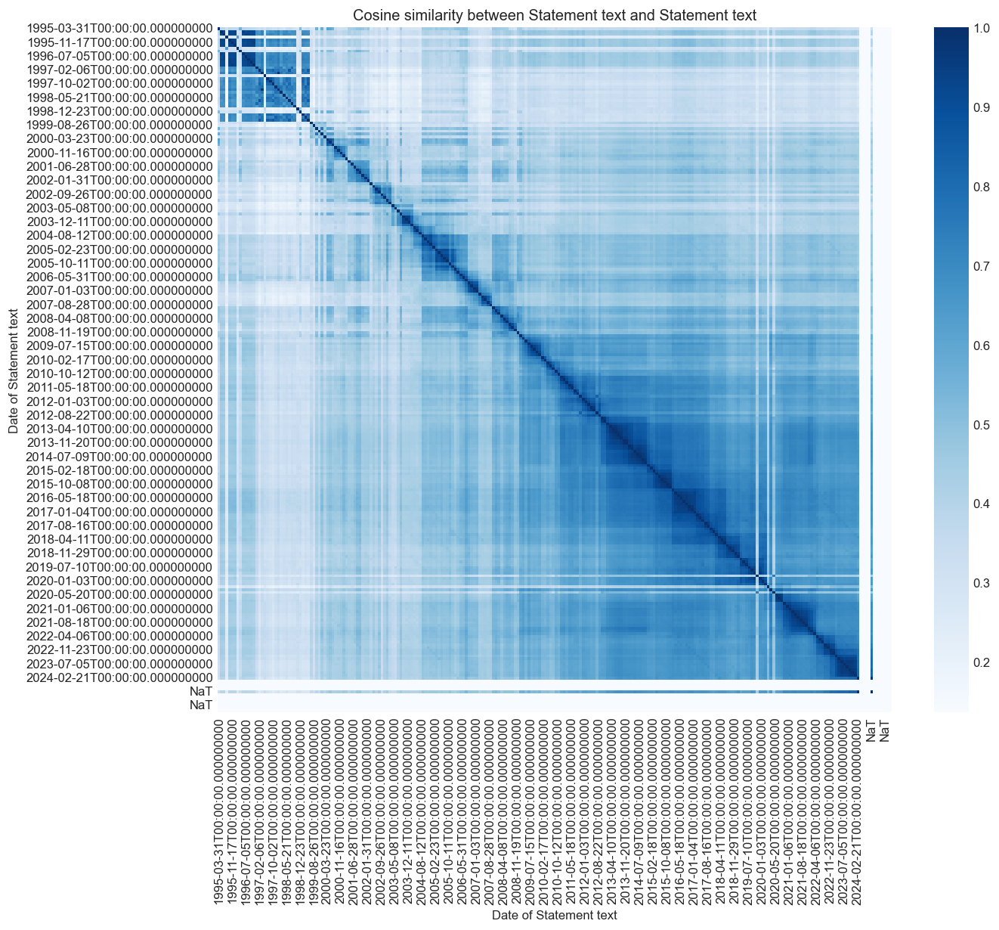

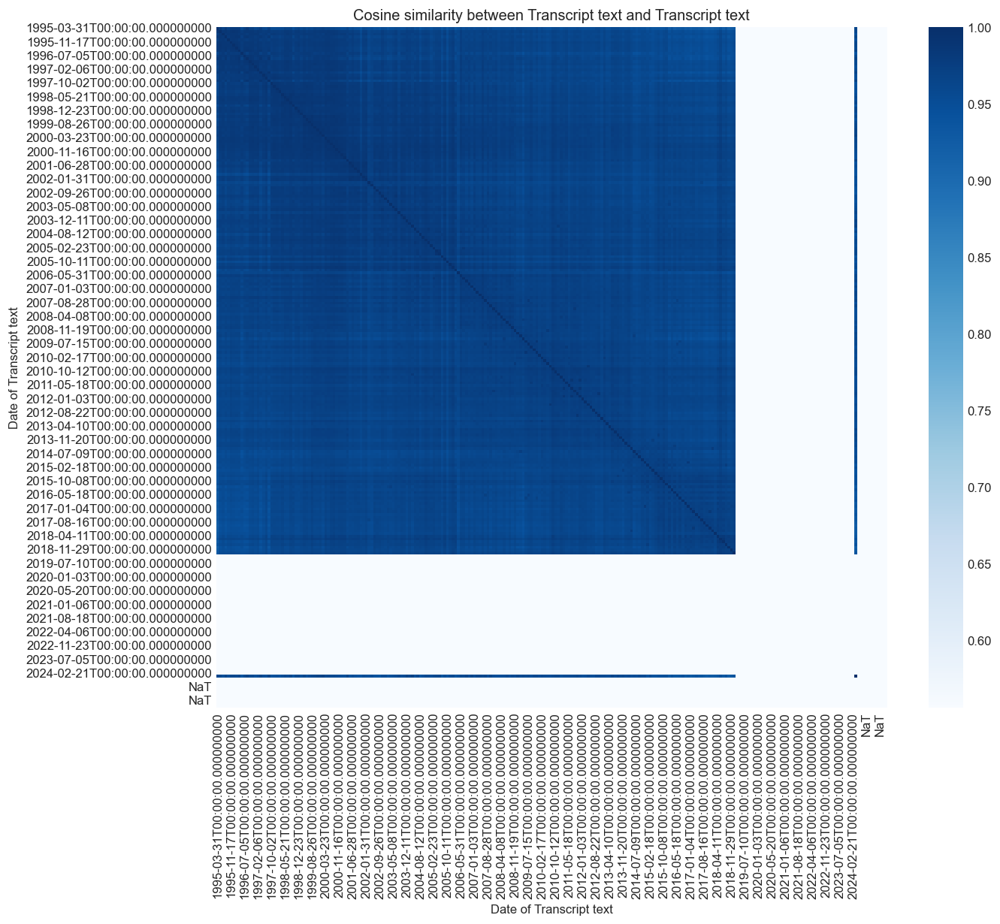

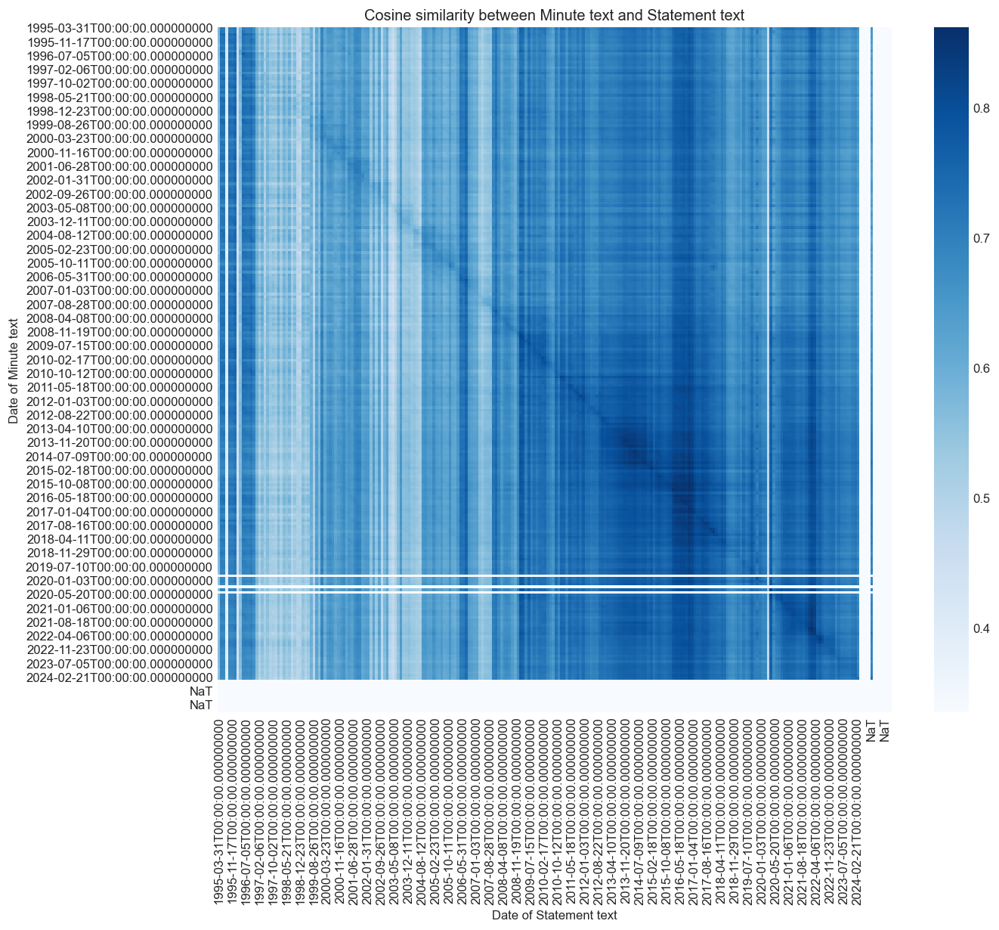

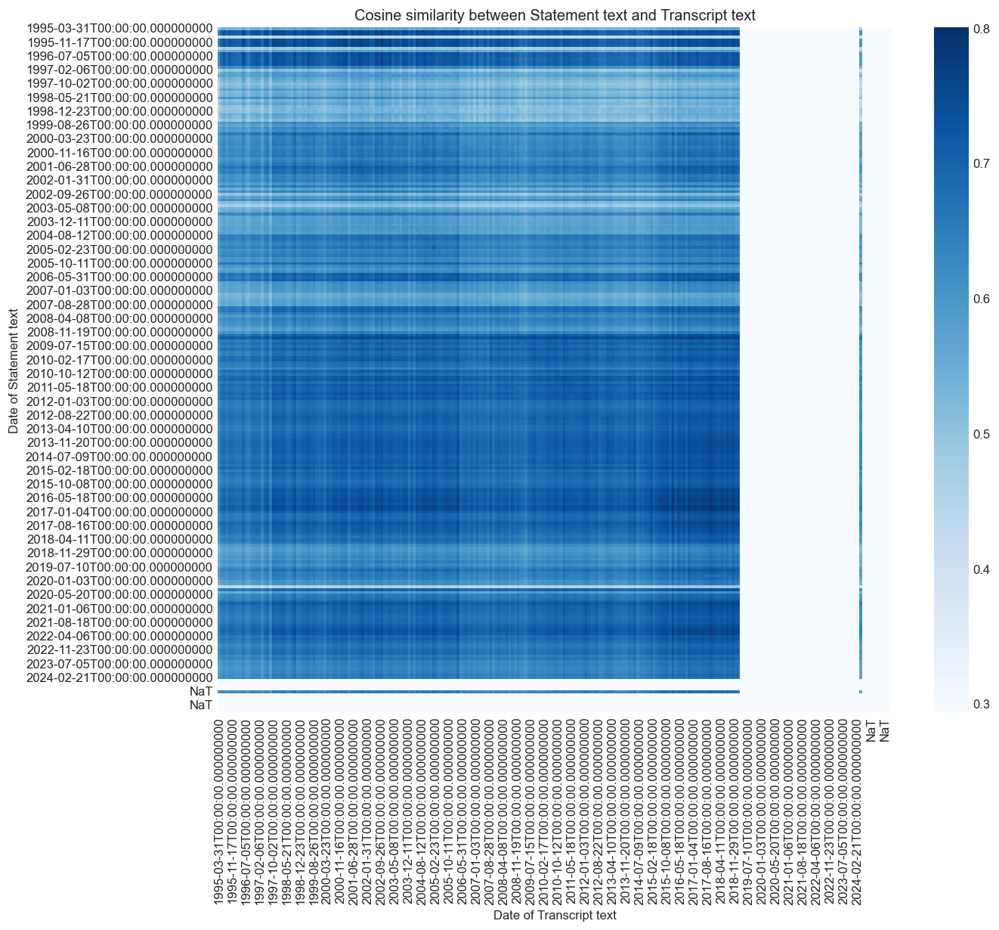

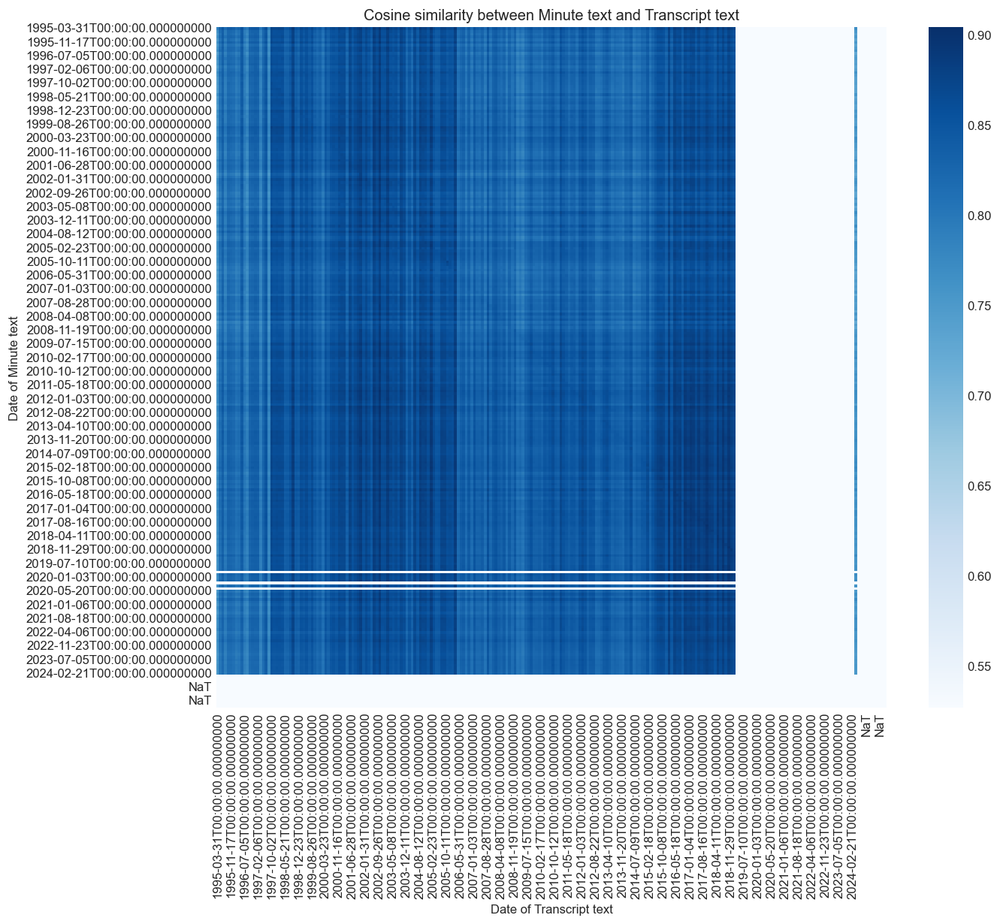

In [ ]:
#calculate cosine similarity between three type of texts using TFIDF, then plot them using heatmap
plot_heatmap("Minute text", "Minute text", minute_text, minute_frame)
plot_heatmap("Statement text", "Statement text", minute_text, minute_frame)
plot_heatmap("Transcript text", "Transcript text", minute_text, minute_frame)
plot_heatmap("Minute text", "Statement text", minute_text, minute_frame)
plot_heatmap("Statement text", "Transcript text", minute_text, minute_frame)
plot_heatmap("Minute text", "Transcript text", minute_text, minute_frame)

In [ ]:
#this function passed a series of text and return a document matrix with TFID features
#each vector in the matrix represents the TFIDF word frequency vector of a text
#the return matrix is in pytroch tensor form
def TFIDF_matrix(ser_text):
    text_collection = ser_text.replace(np.nan, "")
    vectorizer = TfidfVectorizer()
    matrix1 = vectorizer.fit_transform(text_collection)
    matrix2 = matrix1.toarray()
    matrix3 = torch.from_numpy(matrix2)
    return matrix3


#this function calculate cosine similarity matrix between two TFID matrix
#the required inputs are two matrix (in pytorch tensor)
#the output is a similarity matrix (in pytorch tensor)
def cosine_similarity(matrix_a, matrix_b):
    result = matrix_a @ matrix_b.transpose(0,1)
    return result


#derive cosine similarity between two type of text collections
#required two text type in str
#returns cosine similarity matrix
def TFDIF_similarity(text_type1, text_type2):
    Corpous = pd.concat([text_type1, text_type2], axis = 0)
    ag_matrix = TFIDF_matrix(Corpous)
    first_matrix = ag_matrix[:len(text_type1),:]
    second_matrix = ag_matrix[len(text_type1):,:]
    similarity_matrix = cosine_similarity(first_matrix, second_matrix)
    return similarity_matrix


#plot heat map to display consince similarity between texts between different date
#required argument is tw0 text type in str
def plot_heatmap(text_type1, text_type2, dataframe_output):
    similarity_matrix = TFDIF_similarity(text_type1, text_type2)
    non_zero_num = torch.count_nonzero(similarity_matrix).item()
    tot_num = similarity_matrix.numel()
    min_v = similarity_matrix.quantile(1-(non_zero_num/tot_num))
    frame = pd.DataFrame(similarity_matrix.numpy())
    frame.index = dataframe_output["Date"]
    frame.columns = dataframe_output["Date"]
    seaborn.set_context({"figure.figsize":(12.5,10)})
    plot = seaborn.heatmap(data = frame, cmap = "Blues", vmin = min_v)

    plt.title(f"Cosine similarity")
    plt.xlabel(f"Date")
    plt.ylabel(f"Date")
    plt.show()

In [ ]:
speech_text["Type"] = speech_frame["Type"]

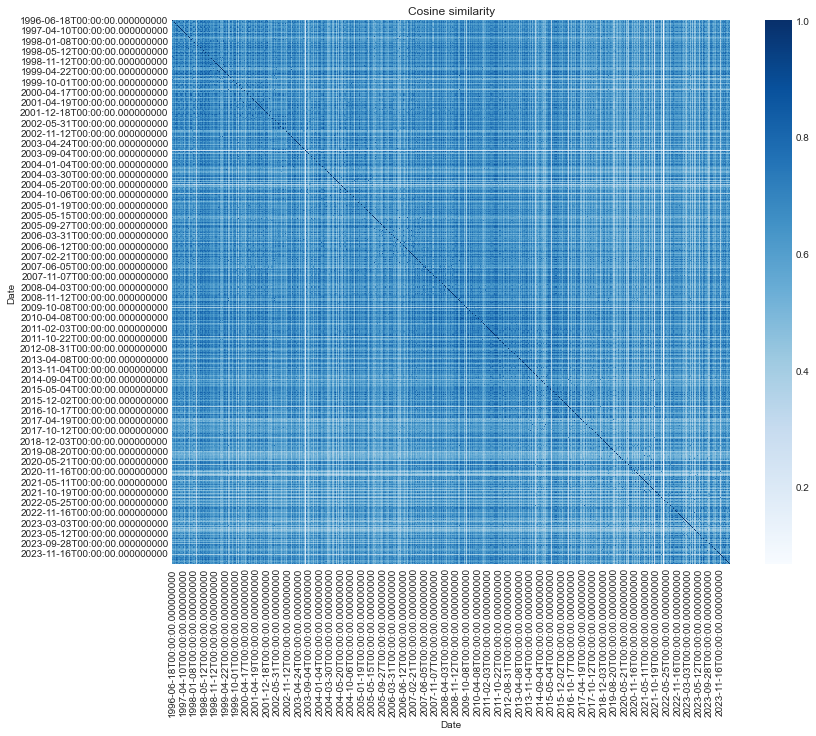

In [ ]:
#calculate cosine similarity between governor speeches
frame = speech_text[(speech_text.Type == "governor")]
speech_g = frame["Speech"]
plot_heatmap(speech_g, speech_g, frame)


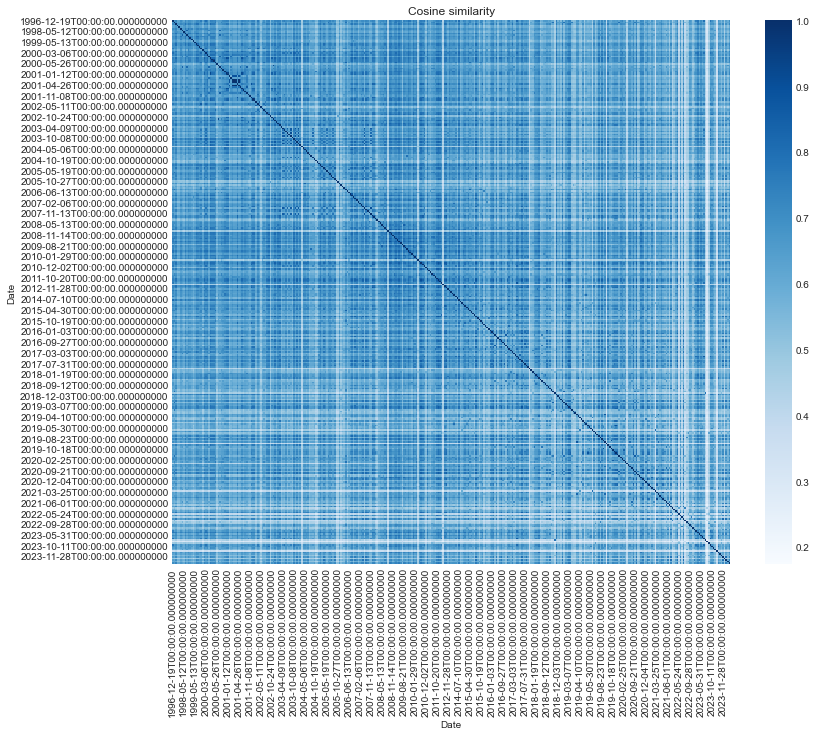

In [ ]:
#calculate cosine similarity between governor speeches
frame = speech_text[(speech_text.Type == "vice chair")]
speech_g = frame["Speech"]
plot_heatmap(speech_g, speech_g, frame)

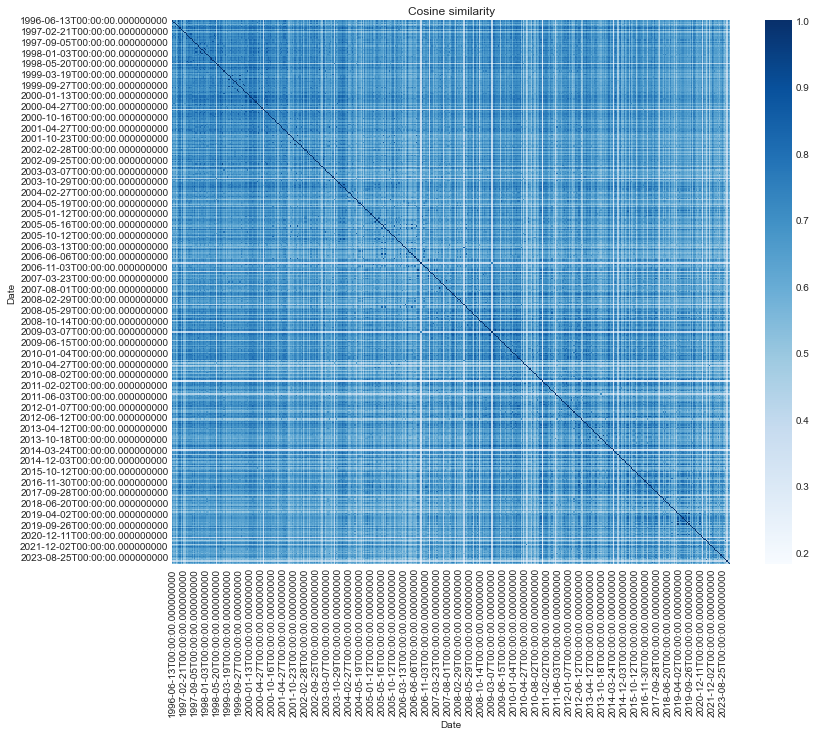

In [ ]:
#calculate cosine similarity between governor speeches
frame = speech_text[(speech_text.Type == "chair")]
speech_g = frame["Speech"]
plot_heatmap(speech_g, speech_g, frame)

In [ ]:
def word_fre(text, pattern):
    if type(text) == str:
        count = len(re.findall(pattern, text))
    else:
        count = np.nan
    return count

def count_plot_wordfeq(pattern, title, recession = True):
    minute = list()
    for text in tqdm(minute_text["Minute text"]):
        minute.append(word_fre(text, pattern))
    minute = pd.Series(minute)

    statement = list()
    for text in tqdm(minute_text["Statement text"]):
        statement.append(word_fre(text, pattern))
    statement = pd.Series(statement)

    transcript = list()
    for text in tqdm(minute_text["Transcript text"]):
        transcript.append(word_fre(text, pattern))
    transcript = pd.Series(transcript)

    speech = list()
    for text in tqdm(speech_text["Speech"]):
        speech.append(word_fre(text, pattern))
    speech = pd.Series(speech)

    fig, axe = plt.subplots(4,1,figsize = (10,12),dpi = 120)

    #account recession periods
    recession_period = [["2001/04/01","2001/11/01"],["2008/01/01","2009/06/01"],["2020/03/01","2020/04/01"]]
    i = 0

    for period in recession_period:
        recession_period[i] = [pd.to_datetime(period[0]), pd.to_datetime(period[1])]
        i += 1

    #plot count in minutes
    date = minute_text["Date"]
    rolling_mean = minute.rolling(window = 8, min_periods=1).mean()

    axe[0].scatter(date, minute, marker = ".", s = 30, c = "lightsteelblue", label = "actual count")
    axe[0].plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average", color = "royalblue")
    axe[0].set_xlim((pd.to_datetime("1995/01/01"), pd.to_datetime("2024/03/18")))
    axe[0].legend()
    axe[0].set_ylabel("Count")
    axe[0].set_xlabel("Date")
    axe[0].set_title("Minutes")

    if recession == True:
        for period in recession_period:
            axe[0].axvspan(period[0],period[1], color = "grey", alpha = 0.2)

    #plot count in statements
    rolling_mean = statement.rolling(window = 8, min_periods=1).mean()

    axe[1].scatter(date, statement, marker = ".", s = 30, c = "lightsteelblue", label = "actual count")
    axe[1].plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average", color = "royalblue")
    axe[1].set_xlim((pd.to_datetime("1995/01/01"), pd.to_datetime("2024/03/18")))
    axe[1].legend()
    axe[1].set_ylabel("Count")
    axe[1].set_xlabel("Date")
    axe[1].set_title("Statements")

    if recession == True:
        for period in recession_period:
            axe[1].axvspan(period[0],period[1], color = "grey", alpha = 0.2)

    #plot count in transcripts
    rolling_mean = transcript.rolling(window = 8, min_periods=1).mean()
    axe[2].scatter(date, transcript, marker = ".", s = 30, c = "lightsteelblue", label = "actual count")
    axe[2].plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average", color = "royalblue")
    axe[2].set_xlim((pd.to_datetime("1995/01/01"), pd.to_datetime("2024/03/18")))
    axe[2].legend()
    axe[2].set_ylabel("Count")
    axe[2].set_xlabel("Date")
    axe[2].set_title("Transcripts")

    if recession == True:
        for period in recession_period:
            axe[2].axvspan(period[0],period[1], color = "grey", alpha = 0.2)

    #plot count in speeches
    date = speech_text["Date"]
    rolling_mean = speech.rolling(window = 30, min_periods=1).mean()
    axe[3].scatter(date, speech, marker = ".", s = 30, c = "lightsteelblue", label = "actual count")
    axe[3].plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average", color = "royalblue")
    axe[3].set_xlim((pd.to_datetime("1995/01/01"), pd.to_datetime("2024/03/18")))
    axe[3].legend()
    axe[3].set_ylabel("Count")
    axe[3].set_xlabel("Date")
    axe[3].set_title("Speeches")

    if recession == True:
        for period in recession_period:
            axe[3].axvspan(period[0],period[1], color = "grey", alpha = 0.2)

    fig.suptitle(title)
    fig.tight_layout()
    plt.show()

A scatter plot of mention of inflation-related entities (inflation and consumer price) in FOMC texts (minutes, statements, transcripts, and speeches) over time, with rolling averages (window size = 8 for minutes, statements, and transcripts, window size = 30 for speeches)

 18%|█▊        | 45/248 [00:00<00:00, 449.37it/s]

100%|██████████| 1719/1719 [00:02<00:00, 761.84it/s]


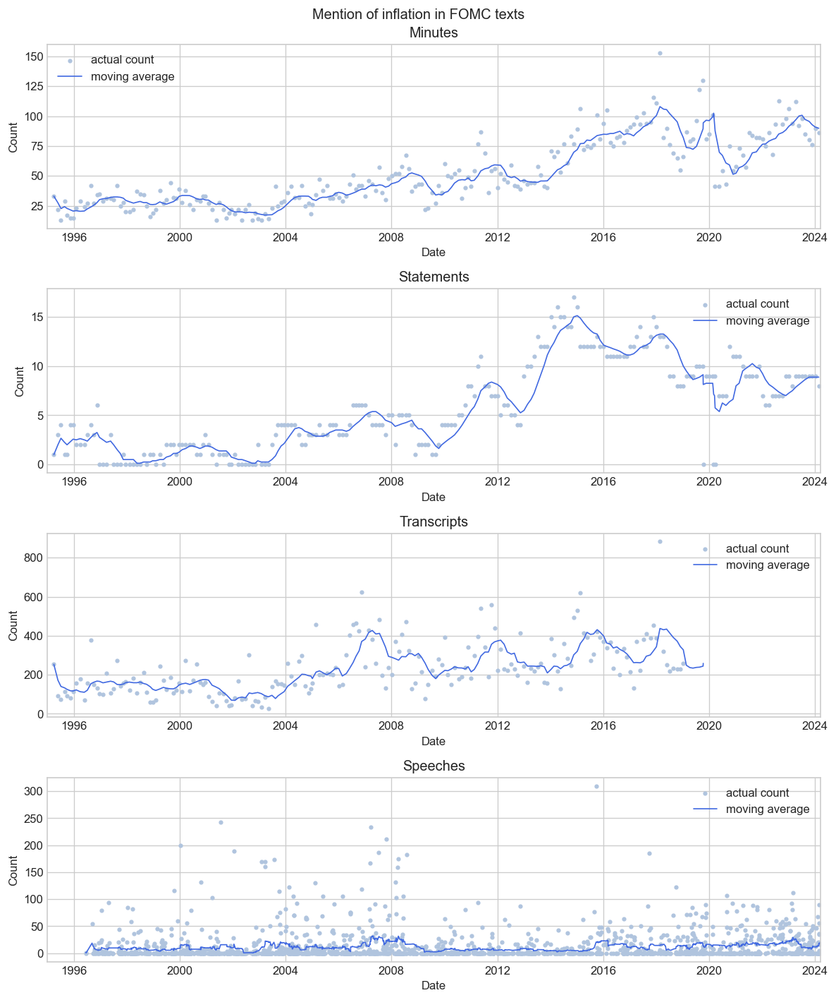

In [ ]:
#count the occurence of inflation related words in fomc texts
pattern = re.compile(r"consumer price|inflation",re.I)
title = "Mention of inflation in FOMC texts"
count_plot_wordfeq(pattern, title, recession = False)

#A scatter plot of mention of labor-market-related entities (labor market, employment, and unemployment) in FOMC texts (minutes, statements, transcripts, and speeches) over time, with rolling averages (window size = 8 for minutes, statements, and transcripts, window size = 30 for speeches)

100%|██████████| 1719/1719 [00:02<00:00, 649.22it/s]


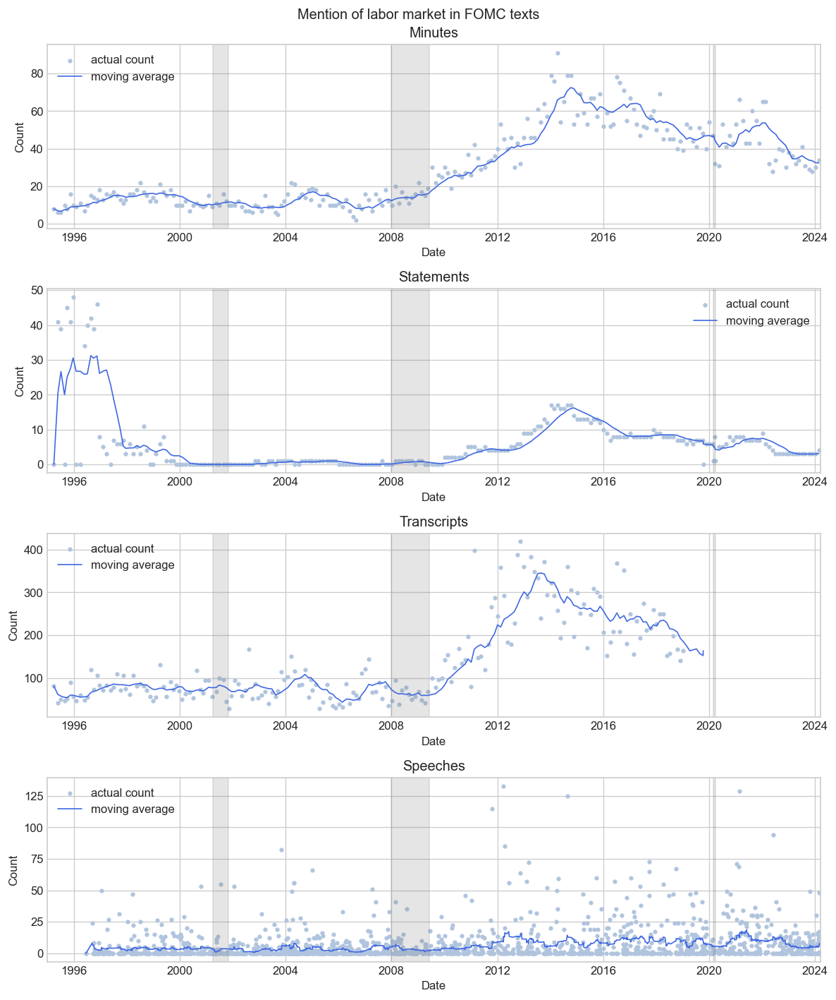

In [ ]:
#count the occurence of labor market related words in fomc texts
pattern = re.compile(r"labor market|employment|unemployment",re.I)
title = "Mention of labor market in FOMC texts"
count_plot_wordfeq(pattern, title)

A scatter plot of mention of economic-activity-related entities (consumer spending,resource utilization,economic activity, and economic growth) in FOMC texts (minutes, statements, transcripts, and speeches) over time, with rolling averages (window size = 8 for minutes, statements, and transcripts, window size = 30 for speeches)

100%|██████████| 1719/1719 [00:03<00:00, 464.27it/s]


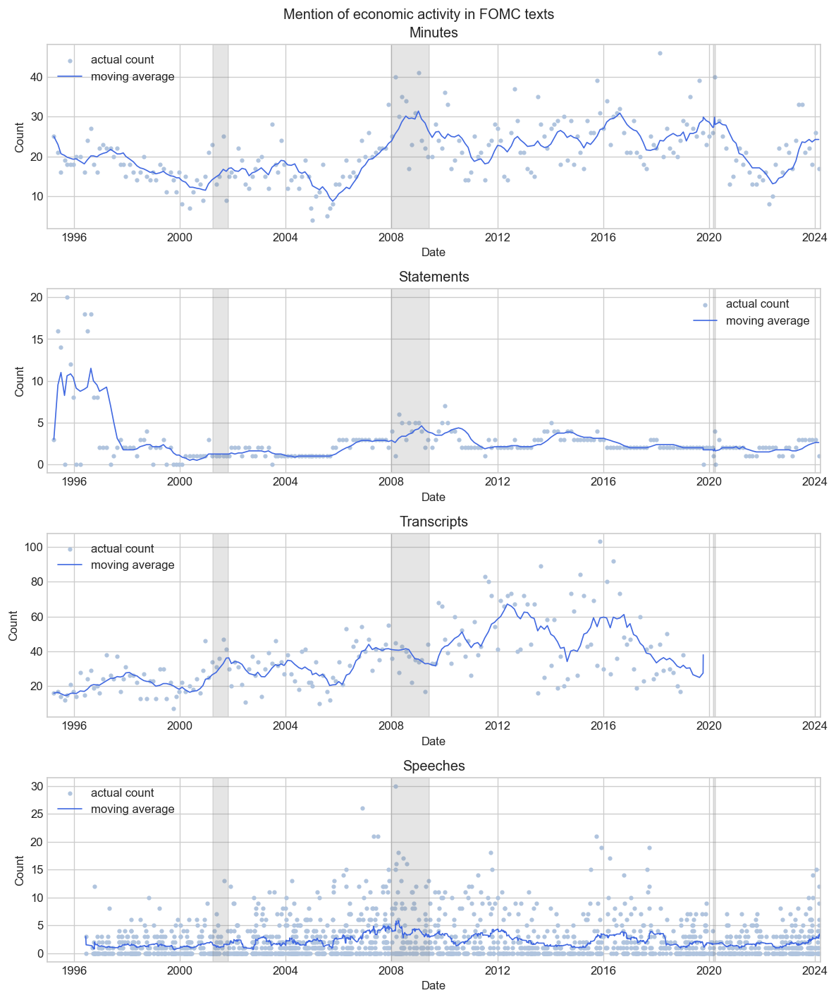

In [ ]:
#count the occurence of economic activity related words in fomc texts
pattern = re.compile(r"consumer spending|resource utilization|economic activity|economic growth",re.I)
title = "Mention of economic activity in FOMC texts"
count_plot_wordfeq(pattern, title)

A scatter plot of mention of policy-tool-related entities (open market|quantitative easing|discount rate|reserve requirment|interest rate|overnight reserve|deposit facility|liquidity swap) in FOMC texts (minutes, statements, transcripts, and speeches) over time, with rolling averages (window size = 8 for minutes, statements, and transcripts, window size = 30 for speeches)

100%|██████████| 1719/1719 [00:07<00:00, 237.11it/s]


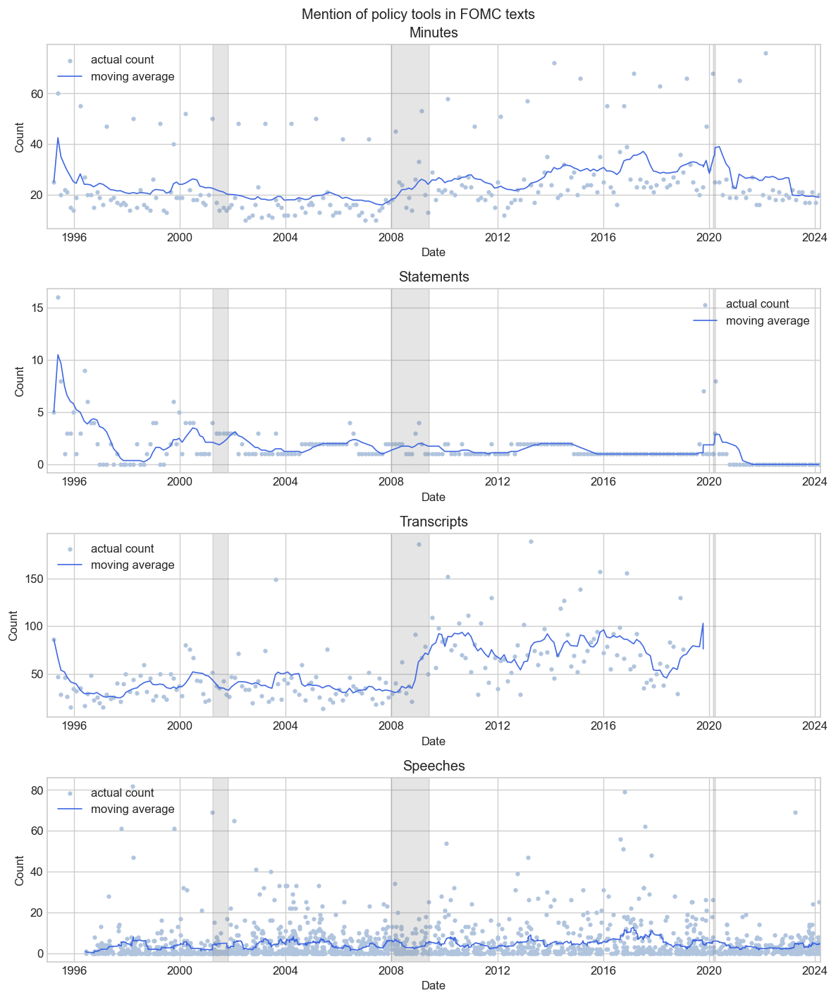

In [ ]:
#count the occurence of policy tools in fomc texts
pattern = re.compile(r"open market|quantitative easing|discount rate|reserve requirment|interest rate|overnight reserve|deposit facility|liquidity swap",re.I)
title = "Mention of policy tools in FOMC texts"
count_plot_wordfeq(pattern, title)

A scatter plot of mention of open market in FOMC texts (minutes, statements transcripts, and speeches) over time, with rolling averages (window size = 8 for minutes, statements, and transcripts, window size = 30 for speeches）

  0%|          | 0/248 [00:00<?, ?it/s]

100%|██████████| 1719/1719 [00:00<00:00, 2611.32it/s]


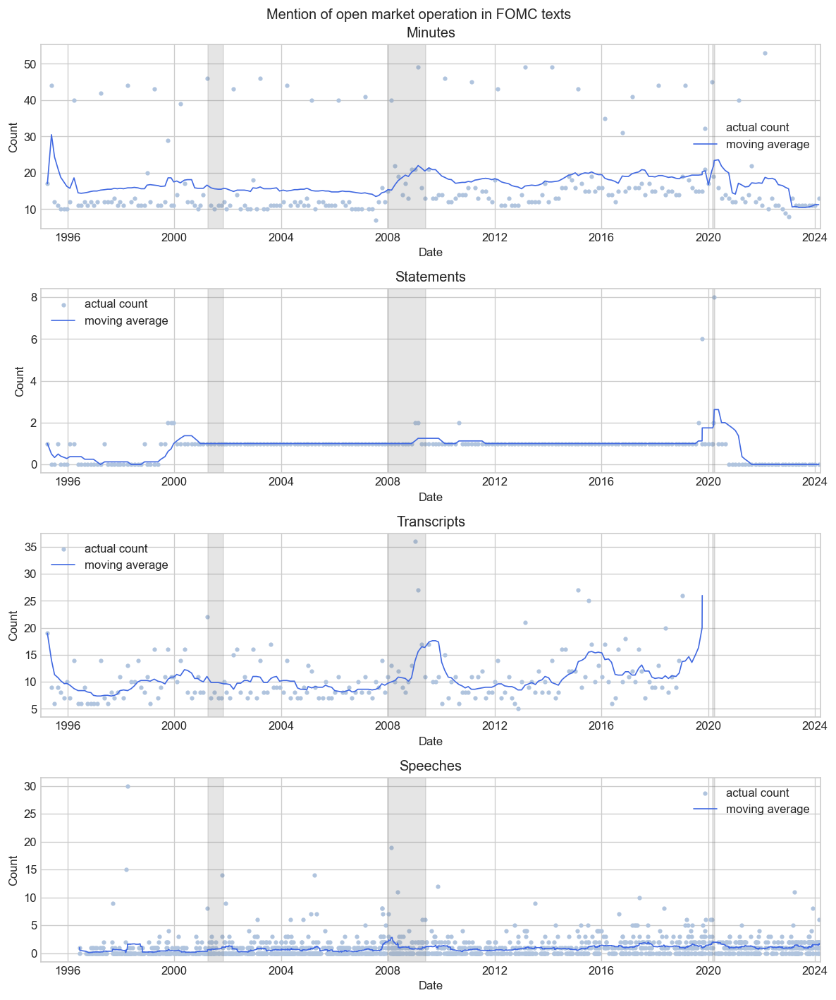

In [ ]:
#count the occurence of policy tools in fomc texts
pattern = re.compile(r"open market",re.I)
title = "Mention of open market operation in FOMC texts"
count_plot_wordfeq(pattern, title)

A scatter plot of mention of quantitative easing in FOMC texts (minutes, statements, transcripts, and speeches) over time, with rolling averages (window size = 8 for minutes, statements, and transcripts, window size = 30 for speeches

  0%|          | 0/248 [00:00<?, ?it/s]

100%|██████████| 1719/1719 [00:00<00:00, 3094.96it/s]


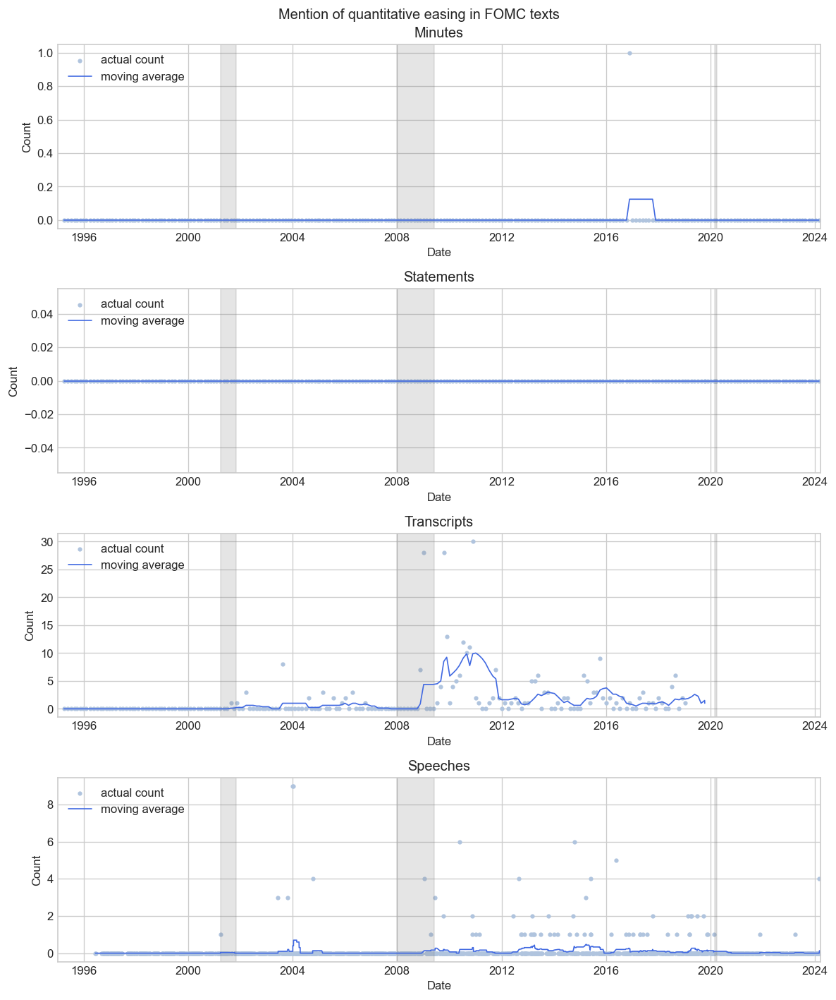

In [ ]:
#count the occurence of policy tools in fomc texts
pattern = re.compile(r"quantitative easing",re.I)
title = "Mention of quantitative easing in FOMC texts"
count_plot_wordfeq(pattern, title)

A scatter plot of mention of interest rate in FOMC texts (minutes, statements, transcripts, and speeches) over time, with rolling averages (window size = 8 for minutes, statements, and transcripts, window size = 30 for speeches）

100%|██████████| 1719/1719 [00:01<00:00, 1663.59it/s]


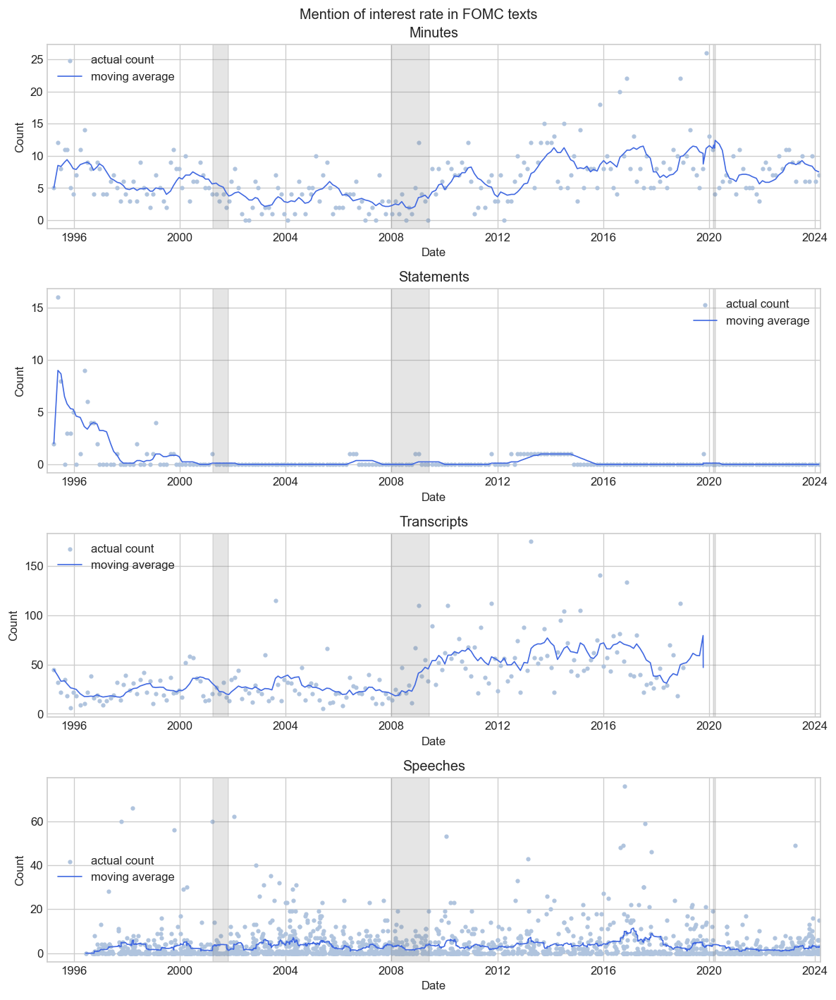

In [ ]:
#count the occurence of policy tools in fomc texts
pattern = re.compile(r"interest rate",re.I)
title = "Mention of interest rate in FOMC texts"
count_plot_wordfeq(pattern, title)

In [ ]:
#this function check wehther cuda is avaliable
#if cuda is avaliable, it rerturns cuda as the deivce, other wise it returns cpu
def set_GPU():
    if torch.cuda.is_available():
        device = torch.device("cuda")
    else:
        device = torch.device("cpu")
    return device

In [ ]:
#check GPU avaliability and set the deivce
Device = set_GPU()

#load the finBERT model
Model = AMFSC.from_pretrained("ProsusAI/finbert")
Model = Model.to(Device)

#load the soft max function
softmax = Softmax(1)

In [ ]:
def predict(tokens, model):
    with torch.no_grad():
        output =  model(**tokens)
    logit = softmax(output[0])
    logit = np.array(logit.cpu())
    sentiment_score = logit[:,0] - logit[:,1]
    return sentiment_score

In [ ]:
word_tokenize = AutoTokenizer.from_pretrained("bert-base-uncased")

In [ ]:
def match_predict(text, pattern):
    if type(text) == str:
        sentiment_score = 0
        count = 0
        sentence_list = sent_tokenize(text)
        for sent in sentence_list:
            if re.search(pattern, sent):
                tokens = word_tokenize(sent, truncation = True, return_tensors="pt")
                tokens = tokens.to(Device)
                sentiment_score += float(predict(tokens, Model))
                count += 1
        if count > 0:
            average_score = sentiment_score/count
        else:
            average_score = np.nan
    else:
        average_score =  np.nan
    return average_score

In [ ]:
def match_sentiment(pattern):
    minute = list()
    for text in tqdm(minute_text["Minute text"]):
        minute.append(match_predict(text, pattern))
    minute = pd.Series(minute)

    statement = list()
    for text in tqdm(minute_text["Statement text"]):
        statement.append(match_predict(text, pattern))
    statement = pd.Series(statement)

    transcript = list()
    for text in tqdm(minute_text["Transcript text"]):
        transcript.append(match_predict(text, pattern))
    transcript = pd.Series(transcript)

    speech = list()
    for text in tqdm(speech_text["Speech"]):
        speech.append(match_predict(text, pattern))
    speech = pd.Series(speech)

    return minute, statement, transcript, speech


def plot_sentiment(minute, statement, transcript, speech, title, recession = True):

    fig, axe = plt.subplots(4,1,figsize = (10,12),dpi = 120)

    #account recession periods
    recession_period = [["2001/04/01","2001/11/01"],["2008/01/01","2009/06/01"],["2020/03/01","2020/04/01"]]
    i = 0
    for period in recession_period:
        recession_period[i] = [pd.to_datetime(period[0]), pd.to_datetime(period[1])]
        i += 1

    #plot count in minutes
    date = minute_text["Date"]
    rolling_mean = minute.rolling(window = 8, min_periods=1).mean()
    mean = [minute.mean()]*len(date)

    axe[0].scatter(date, minute, marker = ".", s = 30, c = "lightsteelblue", label = "actual count")
    axe[0].plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average", color = "royalblue")
    axe[0].plot(date, mean, linestyle = "--", linewidth = 1, label = "mean", color = "lightcoral")
    axe[0].set_xlim((pd.to_datetime("1995/01/01"), pd.to_datetime("2024/03/18")))
    axe[0].legend()
    axe[0].set_ylabel("Score")
    axe[0].set_xlabel("Date")
    axe[0].set_title("Minutes")

    if recession == True:
        for period in recession_period:
            axe[0].axvspan(period[0],period[1], color = "grey", alpha = 0.2)

    #plot count in statements
    rolling_mean = statement.rolling(window = 8, min_periods=1).mean()
    mean = [statement.mean()]*len(date)

    axe[1].scatter(date, statement, marker = ".", s = 30, c = "lightsteelblue", label = "actual count")
    axe[1].plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average", color = "royalblue")
    axe[1].plot(date, mean, linestyle = "--", linewidth = 1, label = "mean", color = "lightcoral")
    axe[1].set_xlim((pd.to_datetime("1995/01/01"), pd.to_datetime("2024/03/18")))
    axe[1].legend()
    axe[1].set_ylabel("Score")
    axe[1].set_xlabel("Date")
    axe[1].set_title("Statements")

    if recession == True:
        for period in recession_period:
            axe[1].axvspan(period[0],period[1], color = "grey", alpha = 0.2)

    #plot count in transcripts
    rolling_mean = transcript.rolling(window = 8, min_periods=1).mean()
    mean = [transcript.mean()]*len(date)

    axe[2].scatter(date, transcript, marker = ".", s = 30, c = "lightsteelblue", label = "actual count")
    axe[2].plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average", color = "royalblue")
    axe[2].plot(date, mean, linestyle = "--", linewidth = 1, label = "mean", color = "lightcoral")
    axe[2].set_xlim((pd.to_datetime("1995/01/01"), pd.to_datetime("2024/03/18")))
    axe[2].legend()
    axe[2].set_ylabel("Score")
    axe[2].set_xlabel("Date")
    axe[2].set_title("Transcripts")

    if recession == True:
        for period in recession_period:
            axe[2].axvspan(period[0],period[1], color = "grey", alpha = 0.2)

    #plot count in speeches
    date = speech_text["Date"]
    rolling_mean = speech.rolling(window = 30, min_periods=1).mean()
    mean = [transcript.mean()]*len(date)

    axe[3].scatter(date, speech, marker = ".", s = 30, c = "lightsteelblue", label = "actual count")
    axe[3].plot(date, rolling_mean, linestyle = "-", linewidth = 1, label = "moving average", color = "royalblue")
    axe[3].plot(date, mean, linestyle = "--", linewidth = 1, label = "mean", color = "lightcoral")
    axe[3].set_xlim((pd.to_datetime("1995/01/01"), pd.to_datetime("2024/03/18")))
    axe[3].legend()
    axe[3].set_ylabel("Score")
    axe[3].set_xlabel("Date")
    axe[3].set_title("Speeches")

    if recession == True:
        for period in recession_period:
            axe[3].axvspan(period[0],period[1], color = "grey", alpha = 0.2)

    fig.suptitle(title)
    fig.tight_layout()
    plt.show()


In [ ]:
pattern = re.compile(r"consumer price|inflation",re.I)
minute_1, statement_1, transcript_1, speech_1 = match_sentiment(pattern)

  0%|          | 0/248 [00:00<?, ?it/s]

100%|██████████| 924/924 [01:49<00:00,  8.46it/s]


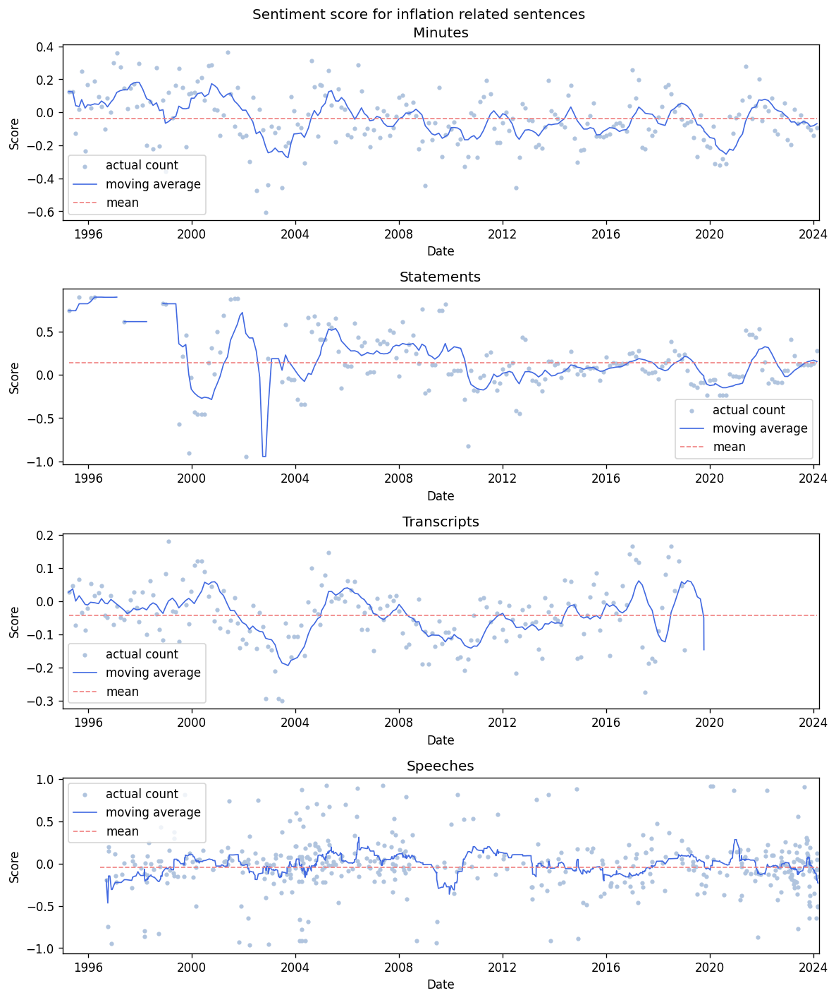

In [ ]:
title = "Sentiment score for inflation related sentences"
plot_sentiment(minute_1, statement_1, transcript_1, speech_1, title, recession = False)

In [ ]:
pattern = re.compile(r"labor market|employment|unemployment",re.I)
minute_2, statement_2, transcript_2, speech_2 = match_sentiment(pattern)

100%|██████████| 924/924 [00:56<00:00, 16.35it/s]


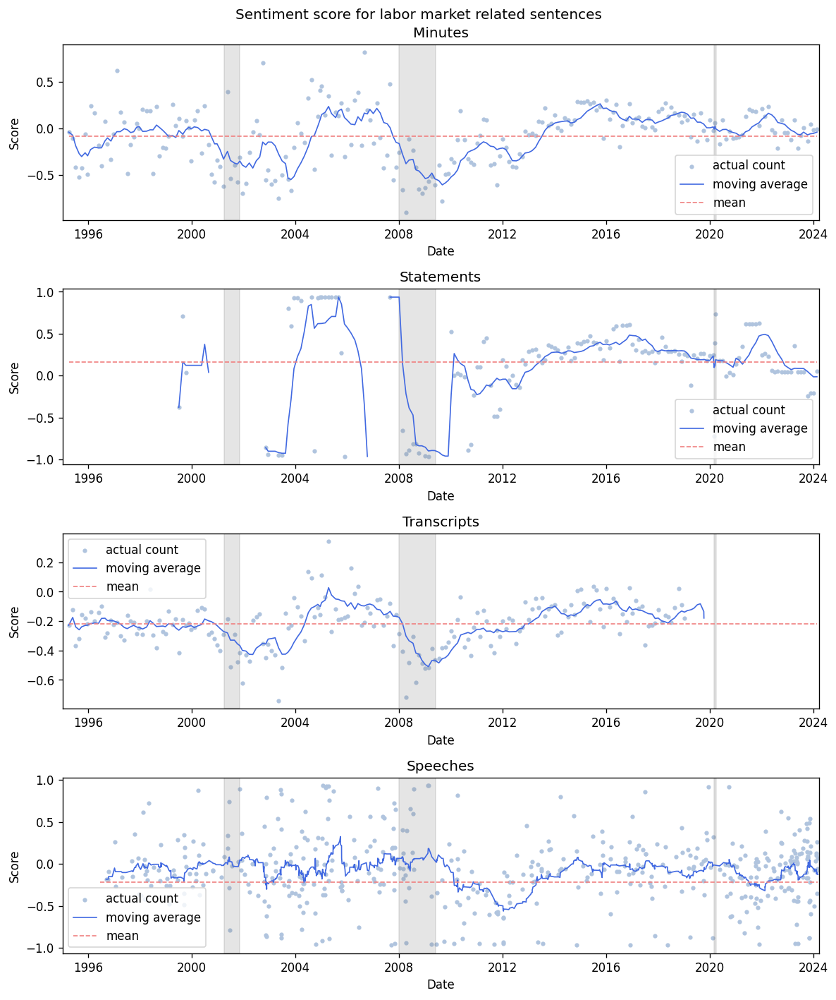

In [ ]:
title = "Sentiment score for labor market related sentences"
plot_sentiment(minute_2, statement_2, transcript_2, speech_2, title)

In [ ]:
pattern = re.compile(r"consumer spending|resource utilization|economic activity|economic growth",re.I)
minute_3, statement_3, transcript_3, speech_3 = match_sentiment(pattern)

100%|██████████| 924/924 [00:28<00:00, 31.99it/s]


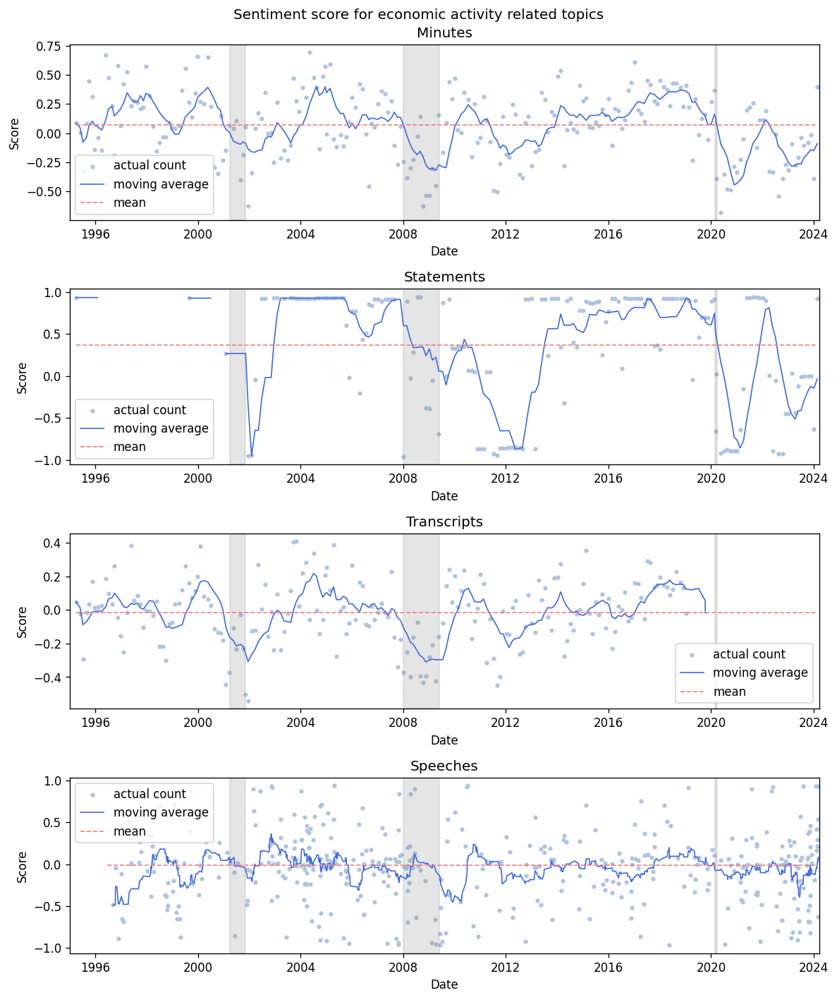

In [ ]:
title = "Sentiment score for economic activity related topics"
plot_sentiment(minute_3, statement_3, transcript_3, speech_3, title)

In [ ]:
adj_list = ["low","high","strong","substantial","large","little","moderate","potential","consistent","accommodative"]
topic_list = ["consumer spending","resource utilization","economic activity","economic growth", "consumer price","inflation","labor market","employment","unemployment"]
tool_list = ["open market","quantitative easing","discount rate","reserve requirment","interest rate","overnight reserve","deposit facility","liquidity swap"]

In [ ]:
#tokenize the paharagraph into sentences, then tokenize sentences into words
def tokenize(text):
    if type(text) == str:
        sentence_list = sent_tokenize(text)
        return sentence_list
    else:
        return np.nan

In [ ]:
#tokenize the text
minute_text["Minute token"] = minute_text["Minute text"].apply(tokenize)
minute_text["Statement token"] = minute_text["Statement text"].apply(tokenize)
minute_text["Transcript token"] = minute_text["Transcript text"].apply(tokenize)
speech_text["Speech token"] = speech_text["Speech"].apply(tokenize)

In [ ]:
def occurence_matrix_t(topic_list, tool_list, text_list):
    dataframe = pd.DataFrame([[0]*len(tool_list)]*len(topic_list), index = topic_list, columns = tool_list)
    for topic in topic_list:
        for tool in tool_list:
            co_occurence = 0
            for text in text_list:
                if type(text) == list:
                    i = 0
                    for sent in text:
                        if (topic in sent) and (tool in sent):
                            co_occurence += 1
                        elif (topic in sent) and (tool in text[max(i-1, 0)]):
                            co_occurence += 1
                        elif (topic in sent) and (tool in text[max(i-2, 0)]):
                            co_occurence += 1
                        elif (topic in sent) and (tool in text[min(i+1, len(text)-1)]):
                            co_occurence += 1
                        elif (topic in sent) and (tool in text[min(i+2, len(text)-1)]):
                            co_occurence += 1
                        i += 1
            dataframe[tool][topic] = co_occurence
    plt.figure(figsize = (12,10),dpi = 60)
    seaborn.heatmap(data = dataframe, annot = True, fmt = "d",  cmap = "RdBu_r")

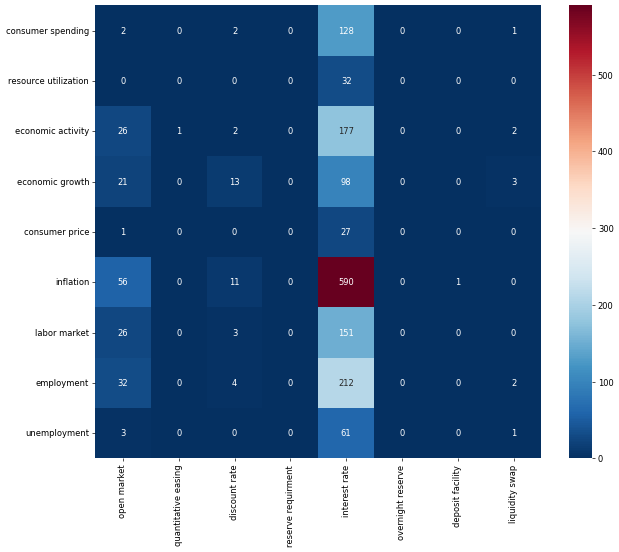

In [ ]:
occurence_matrix_t(topic_list, tool_list, minute_text["Minute token"])

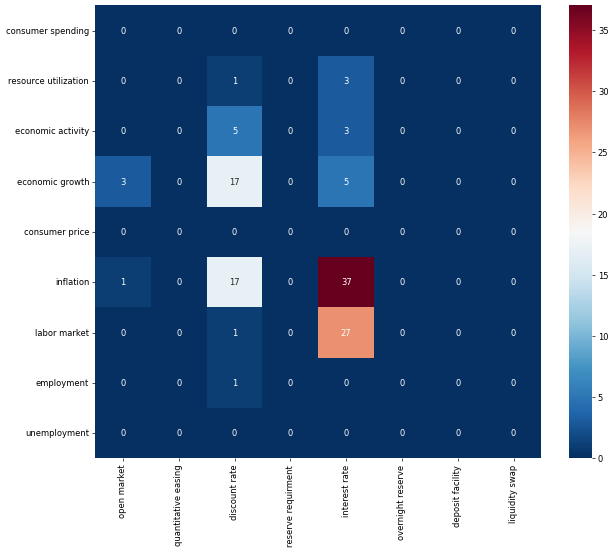

In [ ]:
occurence_matrix_t(topic_list, tool_list, minute_text["Statement token"])

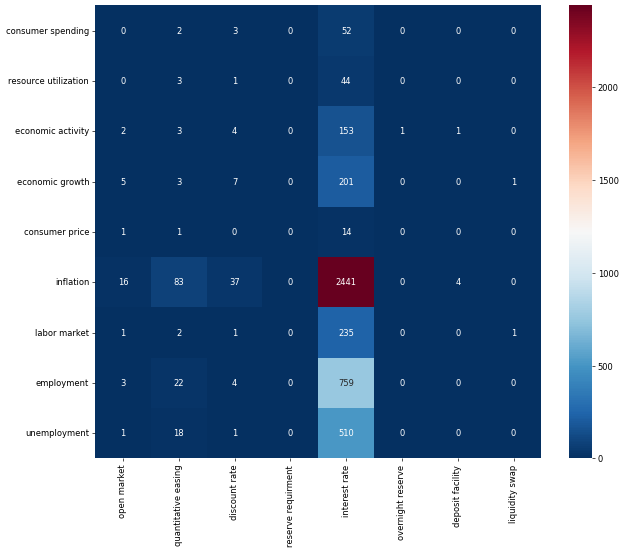

In [ ]:
occurence_matrix_t(topic_list, tool_list, minute_text["Transcript token"])

In [ ]:
def occurence_matrix(row_list, col_list, text_list):
    dataframe = pd.DataFrame([[0]*len(col_list)]*len(row_list), index = row_list, columns = col_list)
    for word1 in row_list:
        for word2 in col_list:
            co_occurence = 0
            for text in text_list:
                if type(text) == list:
                    for sent in text:
                        if (word1 in sent) and (word2 in sent):
                            co_occurence += 1
            dataframe[word2][word1] = co_occurence

    plt.figure(figsize = (12,10),dpi = 60)
    seaborn.heatmap(data = dataframe, annot = True, fmt = "d",  cmap = "RdBu_r")

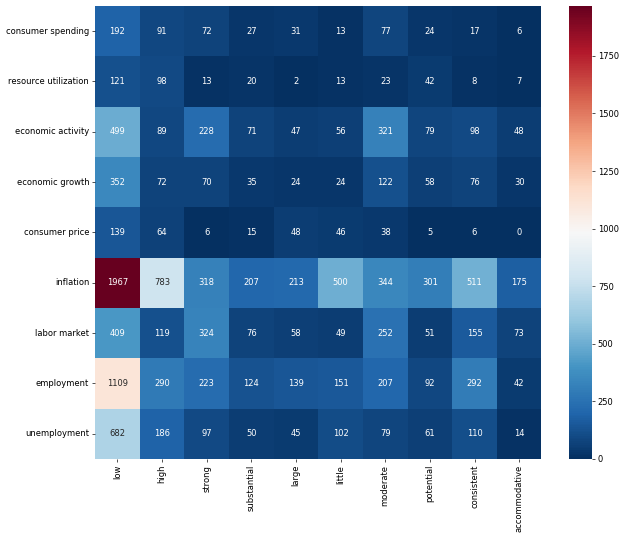

In [ ]:
occurence_matrix(topic_list, adj_list, minute_text["Minute token"])

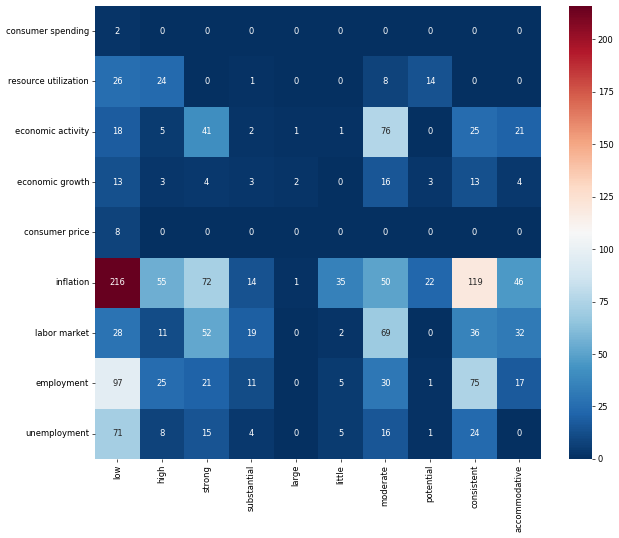

In [ ]:
occurence_matrix(topic_list, adj_list, minute_text["Statement token"])

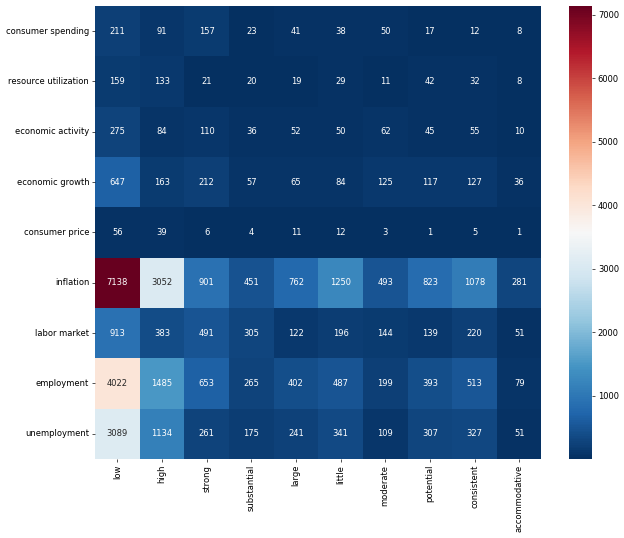

In [ ]:
occurence_matrix(topic_list, adj_list, minute_text["Transcript token"])